In [1]:
import pandas as pd
import time

In [2]:
start=time.perf_counter()

In [3]:
from DatabaseCreator import DatabaseCreator
import CJDH_local_settings

#Run Database Creator
if __name__ == "__main__":
    db_creator = DatabaseCreator(db_settings=CJDH_local_settings.local_settings['FPL_Points_Predictor'])
    fpl_engine = db_creator.get_engine_for("fpl_data_analysis")

In [4]:
from FPLPredictor import FPLPredictor

In [5]:
#add this info to a settings dict?
stats_current_gameweek = 9
picks_current_gameweek = 11
current_season = 20252026

In [6]:
# Load df from sql
df = db_creator.run_sql("""SELECT *
                        FROM playergw_transformed
                          """)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146422 entries, 0 to 146421
Columns: 293 entries, player_name_id to saves_elo_adj_per90_running_avg_prev_10
dtypes: float64(288), object(5)
memory usage: 327.3+ MB


In [7]:
df[(df['season']==20252026)
   &(df['team_name']=='Arsenal')
#    &(df['event']==9)
   &(df['player_name_id']=='Bukayo Saka')
   ][['player_name_id','event','total_points','opp_team_name']].sort_values(by='event')

,player_name_id,event,total_points,opp_team_name
131853,Bukayo Saka,1.0,3.0,Man Utd
131854,Bukayo Saka,2.0,6.0,Leeds
131855,Bukayo Saka,3.0,0.0,Liverpool
131856,Bukayo Saka,4.0,0.0,Nott'm Forest
131857,Bukayo Saka,5.0,1.0,Man City
131810,Bukayo Saka,6.0,2.0,Newcastle
131813,Bukayo Saka,7.0,NaN,West Ham
131816,Bukayo Saka,8.0,7.0,Fulham
131858,Bukayo Saka,9.0,3.0,Crystal Palace
131859,Bukayo Saka,10.0,NaN,Burnley


In [8]:
cbi_defcon_cols = ['cbi_alltime_avg',
 'cbi_per90_alltime_avg',
 'cbi_running_avg_prev_3',
 'cbi_per90_running_avg_prev_3',
 'cbi_elo_adj_running_avg_prev_3',
 'cbi_elo_adj_per90_running_avg_prev_3',
 'cbi_running_avg_prev_5',
 'cbi_per90_running_avg_prev_5',
 'cbi_elo_adj_running_avg_prev_5',
 'cbi_elo_adj_per90_running_avg_prev_5',
 'cbi_running_avg_prev_10',
 'cbi_per90_running_avg_prev_10',
 'cbi_elo_adj_running_avg_prev_10',
 'cbi_elo_adj_per90_running_avg_prev_10',
 'defensive_contribution_alltime_avg',
 'defensive_contribution_per90_alltime_avg',
 'defensive_contribution_running_avg_prev_3',
 'defensive_contribution_per90_running_avg_prev_3',
 'defensive_contribution_elo_adj_running_avg_prev_3',
 'defensive_contribution_elo_adj_per90_running_avg_prev_3',
 'defensive_contribution_running_avg_prev_5',
 'defensive_contribution_per90_running_avg_prev_5',
 'defensive_contribution_elo_adj_running_avg_prev_5',
 'defensive_contribution_elo_adj_per90_running_avg_prev_5',
 'defensive_contribution_running_avg_prev_10',
 'defensive_contribution_per90_running_avg_prev_10',
 'defensive_contribution_elo_adj_running_avg_prev_10',
 'defensive_contribution_elo_adj_per90_running_avg_prev_10',
 'saves_alltime_avg',
 'saves_per90_alltime_avg',
 'saves_running_avg_prev_3',
 'saves_per90_running_avg_prev_3',
 'saves_elo_adj_running_avg_prev_3',
 'saves_elo_adj_per90_running_avg_prev_3',
 'saves_running_avg_prev_5',
 'saves_per90_running_avg_prev_5',
 'saves_elo_adj_running_avg_prev_5',
 'saves_elo_adj_per90_running_avg_prev_5',
 'saves_running_avg_prev_10',
 'saves_per90_running_avg_prev_10',
 'saves_elo_adj_running_avg_prev_10',
 'saves_elo_adj_per90_running_avg_prev_10',
 'recoveries_alltime_avg',
 'recoveries_per90_alltime_avg',
 'recoveries_running_avg_prev_3',
 'recoveries_per90_running_avg_prev_3',
 'recoveries_elo_adj_running_avg_prev_3',
 'recoveries_elo_adj_per90_running_avg_prev_3',
 'recoveries_running_avg_prev_5',
 'recoveries_per90_running_avg_prev_5',
 'recoveries_elo_adj_running_avg_prev_5',
 'recoveries_elo_adj_per90_running_avg_prev_5',
 'recoveries_running_avg_prev_10',
 'recoveries_per90_running_avg_prev_10',
 'recoveries_elo_adj_running_avg_prev_10',
 'recoveries_elo_adj_per90_running_avg_prev_10',
 'tackles_alltime_avg',
 'tackles_per90_alltime_avg',
 'tackles_running_avg_prev_3',
 'tackles_per90_running_avg_prev_3',
 'tackles_elo_adj_running_avg_prev_3',
 'tackles_elo_adj_per90_running_avg_prev_3',
 'tackles_running_avg_prev_5',
 'tackles_per90_running_avg_prev_5',
 'tackles_elo_adj_running_avg_prev_5',
 'tackles_elo_adj_per90_running_avg_prev_5',
 'tackles_running_avg_prev_10',
 'tackles_per90_running_avg_prev_10',
 'tackles_elo_adj_running_avg_prev_10',
 'tackles_elo_adj_per90_running_avg_prev_10']

In [9]:
# #restricts to player_name_id who have >0 minutes in that season
# #model struggles to predict higher values, so maybe cut-off points at 10, or try log(points) as a depvar
# for each indepvar: filter outliers & standardize

Cleaned df size: 7207/13788

Training Set Performance:
R² Score: 0.8124
RMSE: 15.8822
MAE: 11.4780

Test Set Performance:
R² Score: 0.5074
RMSE: 25.8687
MAE: 18.4151

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.560982
                          minutes_elo_adj_running_avg_prev_3    0.070881
                            opp_team_elo_running_avg_prev_10    0.009126
                    goals_scored_elo_adj_running_avg_prev_10    0.008034
                                     bps_running_avg_prev_10    0.006634
                                                opp_team_elo    0.006548
                                 minutes_running_avg_prev_10    0.006402
                                                    elo_diff    0.006268
                             opp_team_elo_running_avg_prev_3    0.006255
                  team_elo_elo_adj_per90_running_avg_prev_10    0.005933
          

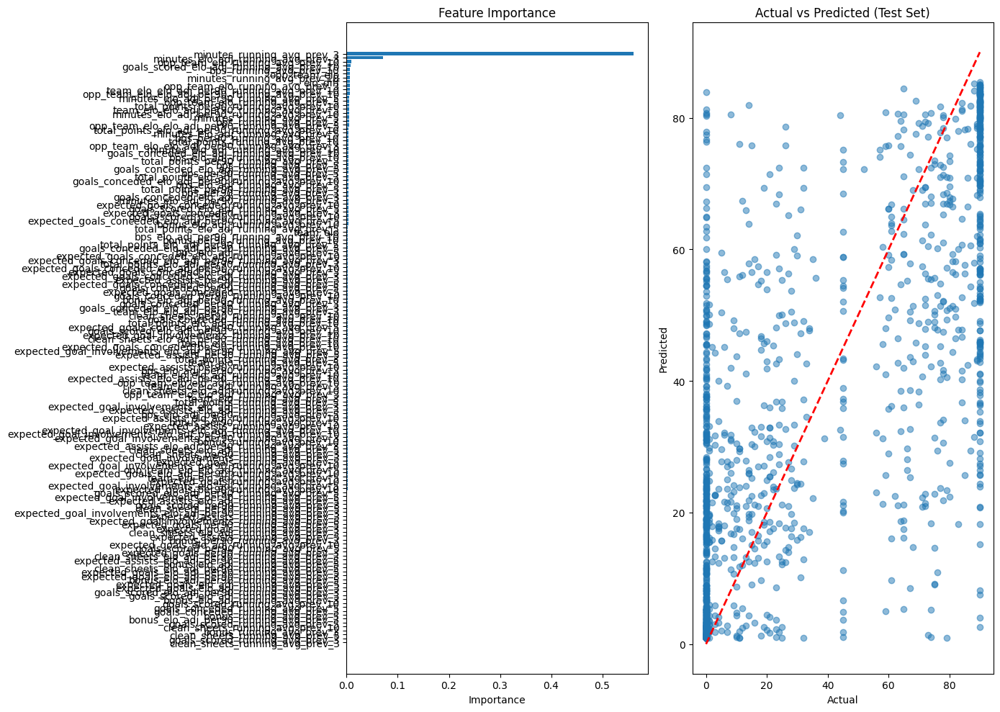

Cleaned df size: 27819/49707

Training Set Performance:
R² Score: 0.6815
RMSE: 21.6913
MAE: 15.9045

Test Set Performance:
R² Score: 0.5341
RMSE: 26.0526
MAE: 18.8868

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.733253
                          minutes_elo_adj_running_avg_prev_3    0.021873
                                 minutes_running_avg_prev_10    0.009554
                          minutes_elo_adj_running_avg_prev_5    0.006468
                                     bps_running_avg_prev_10    0.005392
                                  minutes_running_avg_prev_5    0.004905
                       total_points_per90_running_avg_prev_3    0.004213
                                                    elo_diff    0.004195
                                                opp_team_elo    0.004174
                            opp_team_elo_running_avg_prev_10    0.004036
         

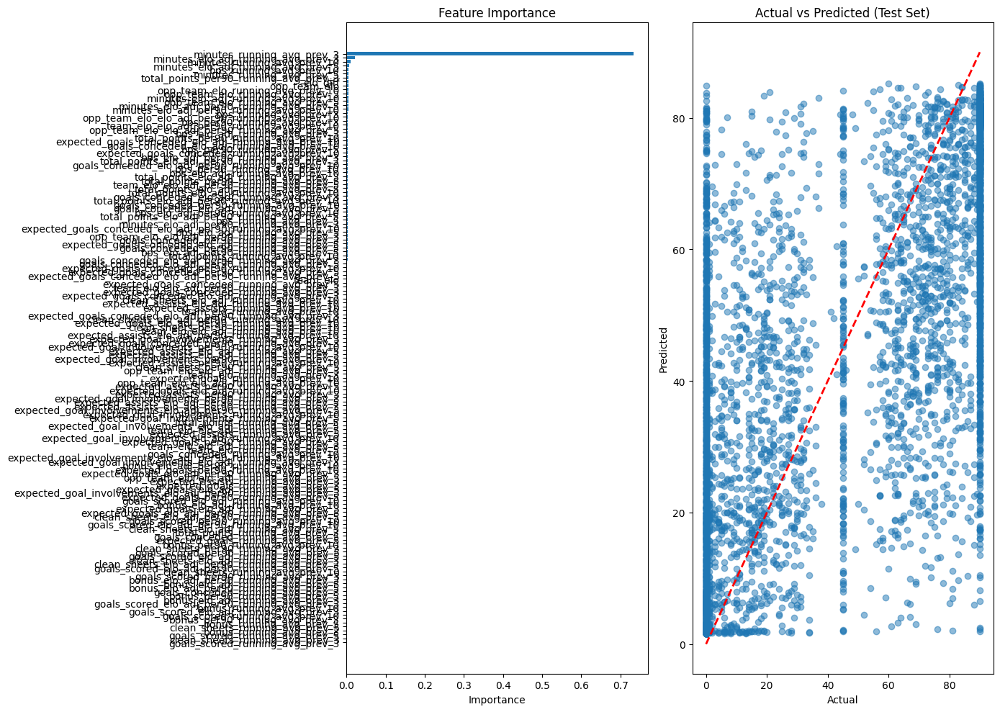

Cleaned df size: 21072/38883

Training Set Performance:
R² Score: 0.6506
RMSE: 24.9405
MAE: 18.4717

Test Set Performance:
R² Score: 0.4807
RMSE: 30.4563
MAE: 22.5286

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.698438
                          minutes_elo_adj_running_avg_prev_3    0.017973
                                 minutes_running_avg_prev_10    0.007987
                            opp_team_elo_running_avg_prev_10    0.006931
                                                opp_team_elo    0.006898
                             opp_team_elo_running_avg_prev_3    0.006040
                             opp_team_elo_running_avg_prev_5    0.006032
                                                    elo_diff    0.005526
                             bps_elo_adj_running_avg_prev_10    0.004549
                                     bps_running_avg_prev_10    0.004409
         

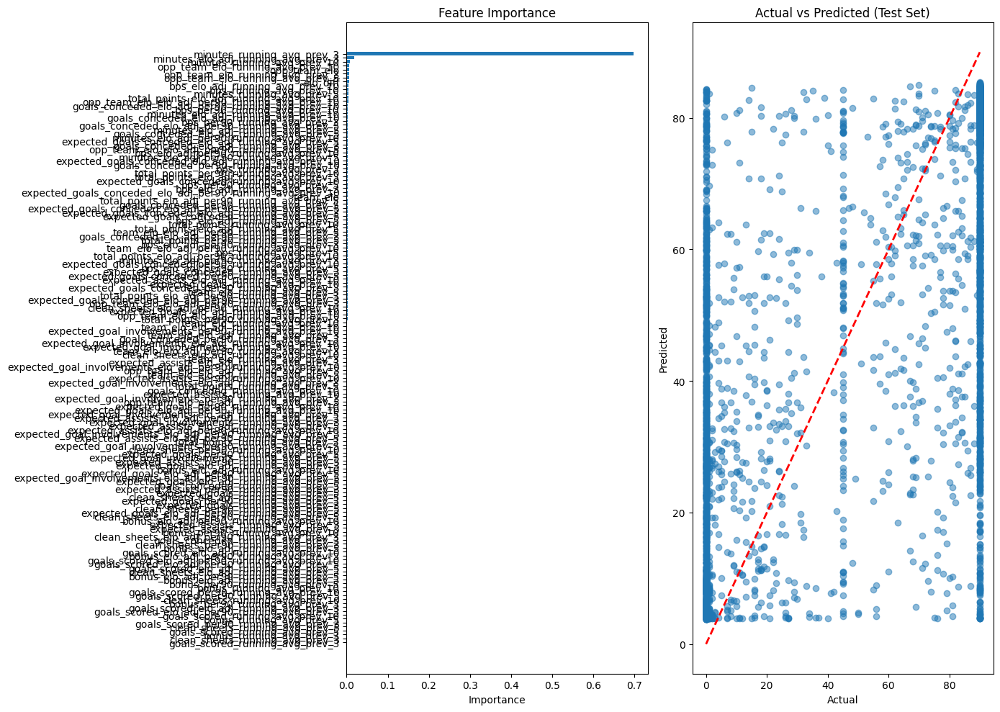

Cleaned df size: 4524/8249

Training Set Performance:
R² Score: 0.8451
RMSE: 17.6076
MAE: 9.7597

Test Set Performance:
R² Score: 0.6771
RMSE: 25.4015
MAE: 14.6834

Feature Importance:
                                                     feature  importance
                                  minutes_running_avg_prev_3    0.614342
                             total_points_running_avg_prev_3    0.042732
                     total_points_elo_adj_running_avg_prev_3    0.042444
                          minutes_elo_adj_running_avg_prev_3    0.014155
                    minutes_elo_adj_per90_running_avg_prev_3    0.014094
                            opp_team_elo_running_avg_prev_10    0.010405
                                                opp_team_elo    0.009271
                        bps_elo_adj_per90_running_avg_prev_3    0.008709
                       total_points_per90_running_avg_prev_3    0.008418
                             opp_team_elo_running_avg_prev_3    0.008003
            

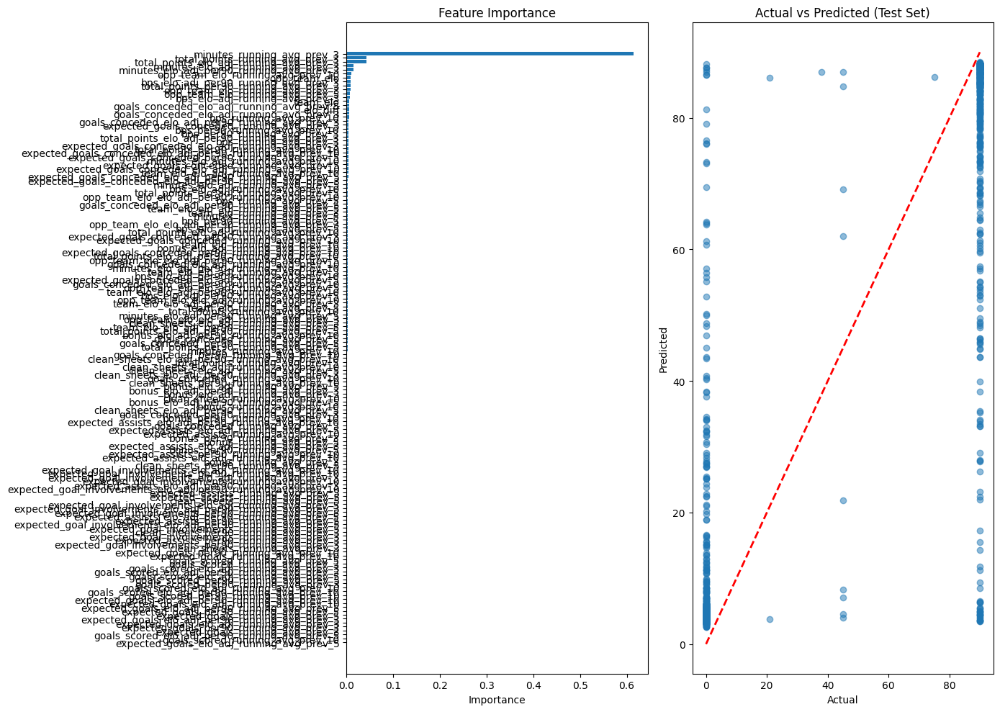

In [10]:
filtered = (df['player_season_minutes_total']>0)#&(df['total_points']<15)#&(df['minutes']>45)

if __name__ == "__main__":
    
    FWD_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols
        )
    FWD_mins_predictor.fit()
    FWD_mins_predictor.plot_results()

    MID_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_mins_predictor.fit()
    MID_mins_predictor.plot_results()

    DEF_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_mins_predictor.fit()
    DEF_mins_predictor.plot_results()

    GK_mins_predictor = FPLPredictor(
        data=df[filtered],
        target='minutes',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_mins_predictor.fit()
    GK_mins_predictor.plot_results()

target=expected_goals_per90, FWD_xG_predictor
Cleaned df size: 2287/4002

Training Set Performance:
R² Score: 0.6653
RMSE: 0.2598
MAE: 0.1985

Test Set Performance:
R² Score: 0.0809
RMSE: 0.4477
MAE: 0.3231

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.039405
expected_goal_involvements_elo_adj_per90_running_avg_prev_10    0.035450
                                                opp_team_elo    0.031407
        expected_goal_involvements_per90_running_avg_prev_10    0.030263
          expected_assists_elo_adj_per90_running_avg_prev_10    0.021810
            expected_goals_elo_adj_per90_running_avg_prev_10    0.021779
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.018111
 expected_goal_involvements_elo_adj_per90_running_avg_prev_5    0.015536
              total_points_elo_adj_per90_running_avg_prev_10    0.015066
                  expected_assists_per90_r

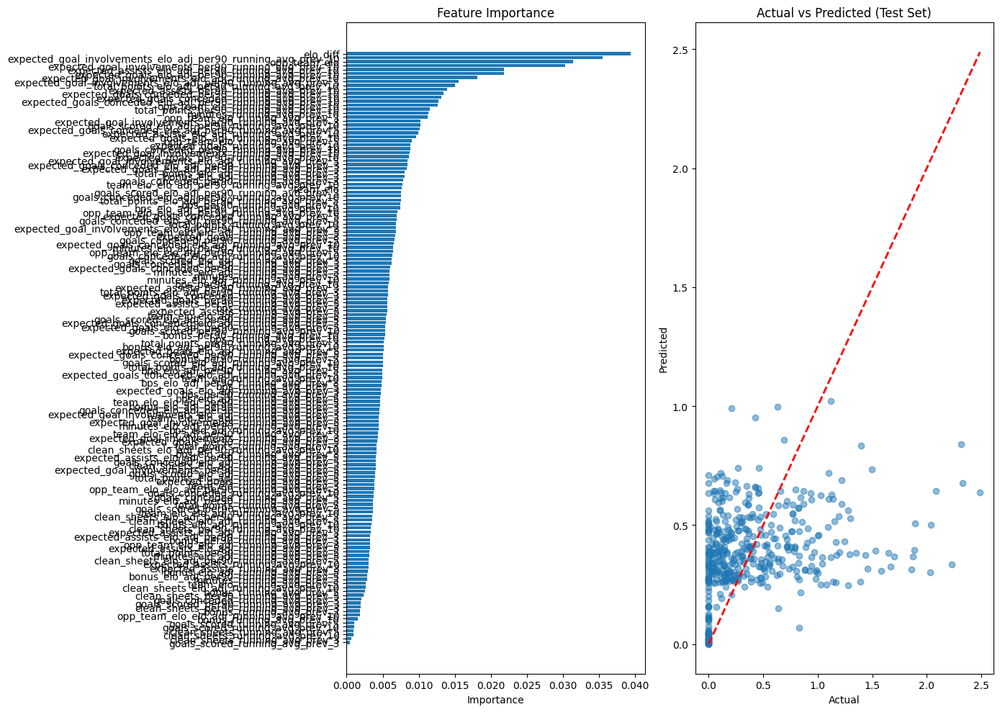

target=expected_goals_per90, MID_xG_predictor
Cleaned df size: 10219/16507

Training Set Performance:
R² Score: 0.5480
RMSE: 0.1729
MAE: 0.1136

Test Set Performance:
R² Score: 0.1256
RMSE: 0.2347
MAE: 0.1437

Feature Importance:
                                                     feature  importance
                          expected_goals_running_avg_prev_10    0.150424
                    expected_goals_per90_running_avg_prev_10    0.052333
                                                opp_team_elo    0.040313
                  expected_goals_elo_adj_running_avg_prev_10    0.026974
                                                    elo_diff    0.023770
            expected_goals_elo_adj_per90_running_avg_prev_10    0.022561
                             opp_team_elo_running_avg_prev_5    0.020338
                     expected_goals_per90_running_avg_prev_5    0.015368
        expected_goal_involvements_per90_running_avg_prev_10    0.013744
                             opp_team_el

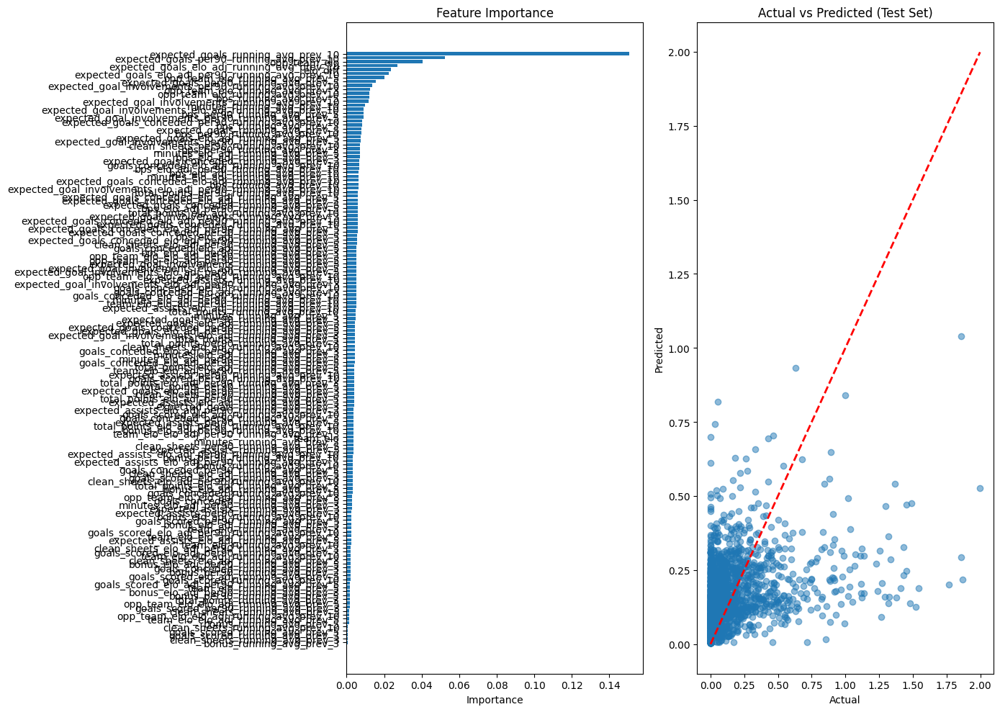

target=expected_goals_per90, DEF_xG_predictor
Cleaned df size: 8825/14613

Training Set Performance:
R² Score: 0.3644
RMSE: 0.0927
MAE: 0.0537

Test Set Performance:
R² Score: 0.0044
RMSE: 0.1143
MAE: 0.0624

Feature Importance:
                                                     feature  importance
                                                opp_team_elo    0.035338
            expected_goals_elo_adj_per90_running_avg_prev_10    0.033409
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.028436
                        bps_elo_adj_per90_running_avg_prev_5    0.028367
                  expected_goals_elo_adj_running_avg_prev_10    0.026559
          expected_goals_conceded_elo_adj_running_avg_prev_3    0.020653
              total_points_elo_adj_per90_running_avg_prev_10    0.019787
                             opp_team_elo_running_avg_prev_5    0.019714
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.019329
                             opp_team_elo

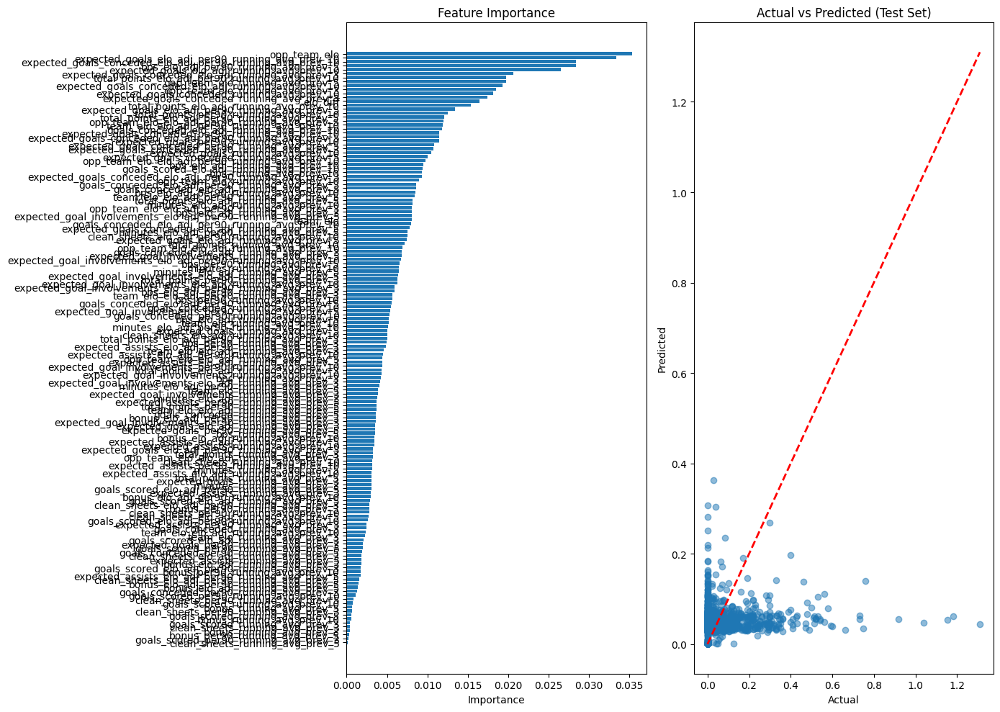

In [11]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_goals_per90, FWD_xG_predictor")
    FWD_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xG_predictor.fit()
    FWD_xG_predictor.plot_results()

    print("target=expected_goals_per90, MID_xG_predictor")
    MID_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xG_predictor.fit()
    MID_xG_predictor.plot_results()
    
    print("target=expected_goals_per90, DEF_xG_predictor")
    DEF_xG_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xG_predictor.fit()
    DEF_xG_predictor.plot_results()

target=expected_assists_per90, FWD_xA_predictor
Cleaned df size: 2287/4002

Training Set Performance:
R² Score: 0.6066
RMSE: 0.0803
MAE: 0.0527

Test Set Performance:
R² Score: -0.0684
RMSE: 0.1250
MAE: 0.0801

Feature Importance:
                                                     feature  importance
                expected_assists_elo_adj_running_avg_prev_10    0.062749
                 expected_assists_elo_adj_running_avg_prev_3    0.039556
                                                opp_team_elo    0.038169
                        bps_elo_adj_per90_running_avg_prev_5    0.024950
                                                    elo_diff    0.023386
                        expected_assists_running_avg_prev_10    0.022551
                             opp_team_elo_running_avg_prev_3    0.020360
                       clean_sheets_per90_running_avg_prev_3    0.020274
           expected_assists_elo_adj_per90_running_avg_prev_5    0.018288
                  expected_assists_per9

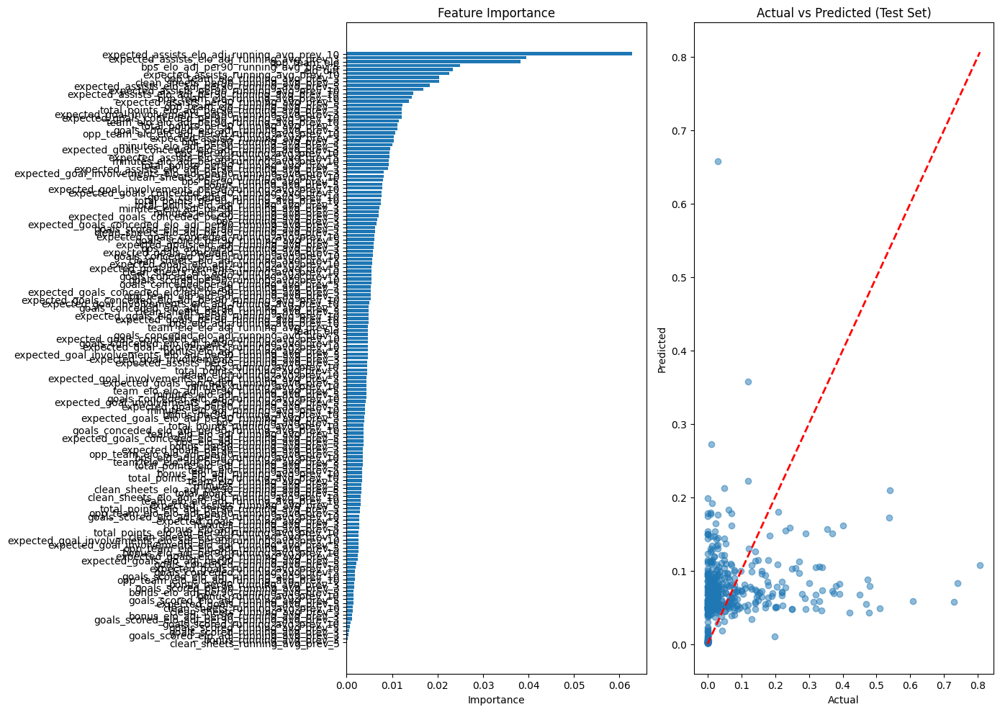

target=expected_assists_per90, MID_xA_predictor
Cleaned df size: 10219/16507

Training Set Performance:
R² Score: 0.4868
RMSE: 0.1183
MAE: 0.0806

Test Set Performance:
R² Score: 0.1666
RMSE: 0.1448
MAE: 0.0945

Feature Importance:
                                                     feature  importance
                expected_assists_elo_adj_running_avg_prev_10    0.105071
          expected_assists_elo_adj_per90_running_avg_prev_10    0.090041
                                                    elo_diff    0.040535
                                                opp_team_elo    0.031976
                  expected_assists_per90_running_avg_prev_10    0.027242
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.025710
                        expected_assists_running_avg_prev_10    0.020177
                                 minutes_running_avg_prev_10    0.014304
expected_goal_involvements_elo_adj_per90_running_avg_prev_10    0.013692
              expected_goal_involvemen

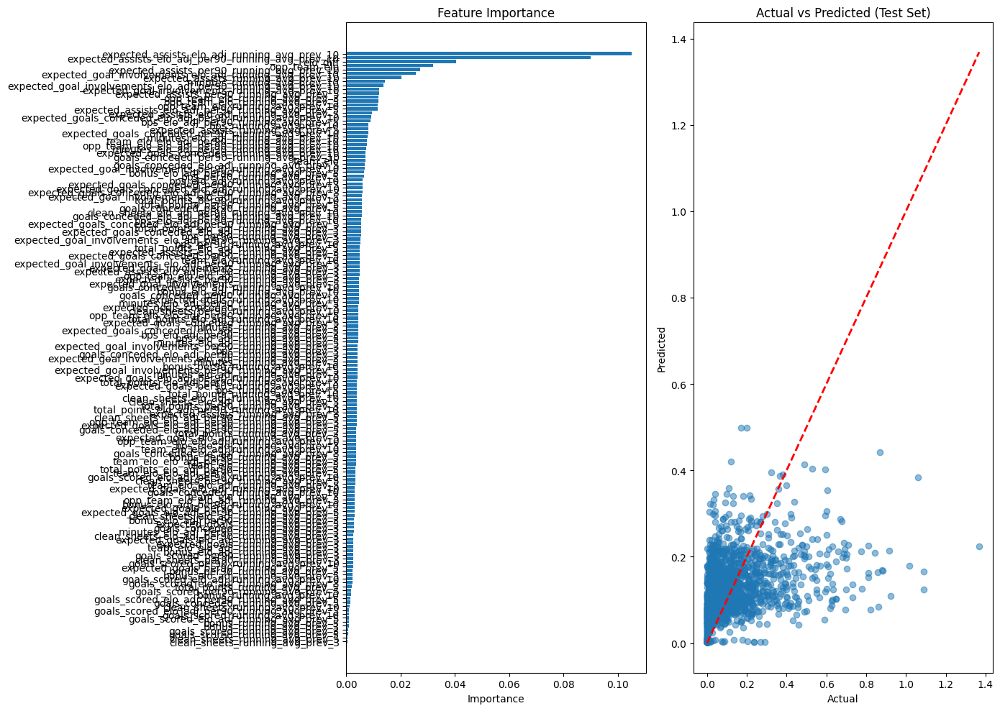

target=expected_assists_per90, DEF_xA_predictor
Cleaned df size: 8825/14613

Training Set Performance:
R² Score: 0.5164
RMSE: 0.0723
MAE: 0.0426

Test Set Performance:
R² Score: 0.0633
RMSE: 0.0985
MAE: 0.0535

Feature Importance:
                                                     feature  importance
          expected_assists_elo_adj_per90_running_avg_prev_10    0.107812
                        expected_assists_running_avg_prev_10    0.063621
                expected_assists_elo_adj_running_avg_prev_10    0.054875
                  expected_assists_per90_running_avg_prev_10    0.046498
                                                opp_team_elo    0.044451
                             opp_team_elo_running_avg_prev_3    0.020349
                                                    elo_diff    0.017898
                            opp_team_elo_running_avg_prev_10    0.016464
                 expected_goals_conceded_running_avg_prev_10    0.014912
           expected_goals_conceded_per9

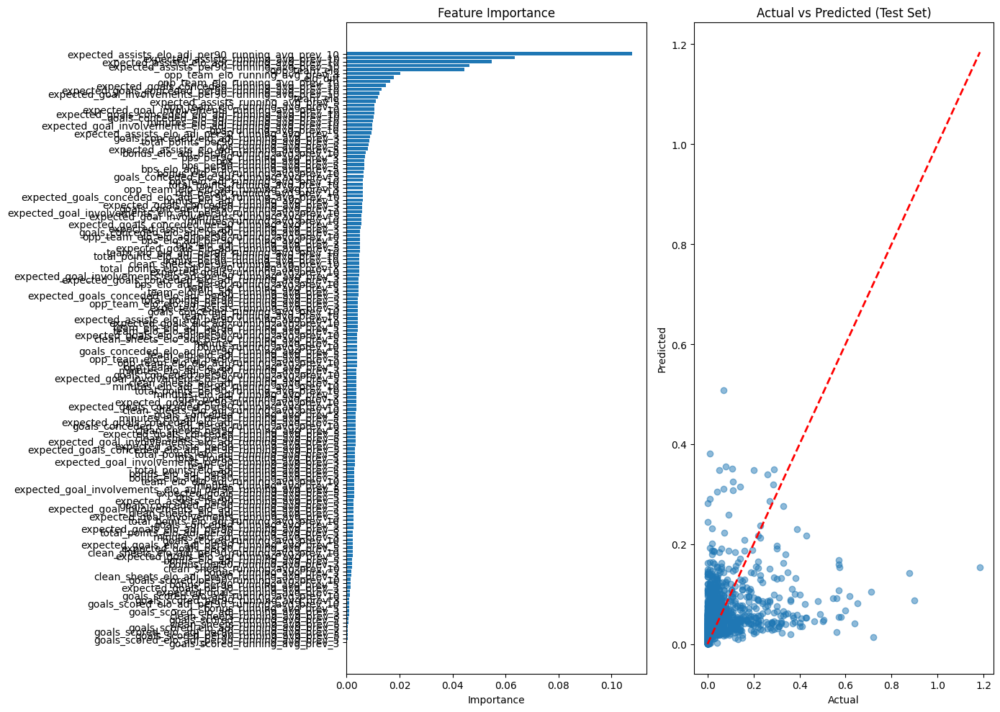

In [12]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_assists_per90, FWD_xA_predictor")
    FWD_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xA_predictor.fit()
    FWD_xA_predictor.plot_results()

    print("target=expected_assists_per90, MID_xA_predictor")
    MID_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xA_predictor.fit()
    MID_xA_predictor.plot_results()
    
    print("target=expected_assists_per90, DEF_xA_predictor")
    DEF_xA_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_assists_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xA_predictor.fit()
    DEF_xA_predictor.plot_results()

target=expected_goals_conceded_per90, FWD_xGC_predictor
Cleaned df size: 2287/4002

Training Set Performance:
R² Score: 0.7582
RMSE: 0.4659
MAE: 0.3644

Test Set Performance:
R² Score: 0.2438
RMSE: 0.8212
MAE: 0.6032

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.170234
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.136075
           expected_goals_conceded_per90_running_avg_prev_10    0.076906
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.036664
          expected_goals_conceded_elo_adj_running_avg_prev_5    0.023947
                                                opp_team_elo    0.019695
                            opp_team_elo_running_avg_prev_10    0.018117
                 expected_goals_conceded_running_avg_prev_10    0.016541
                             opp_team_elo_running_avg_prev_5    0.010879
                    minutes_elo_

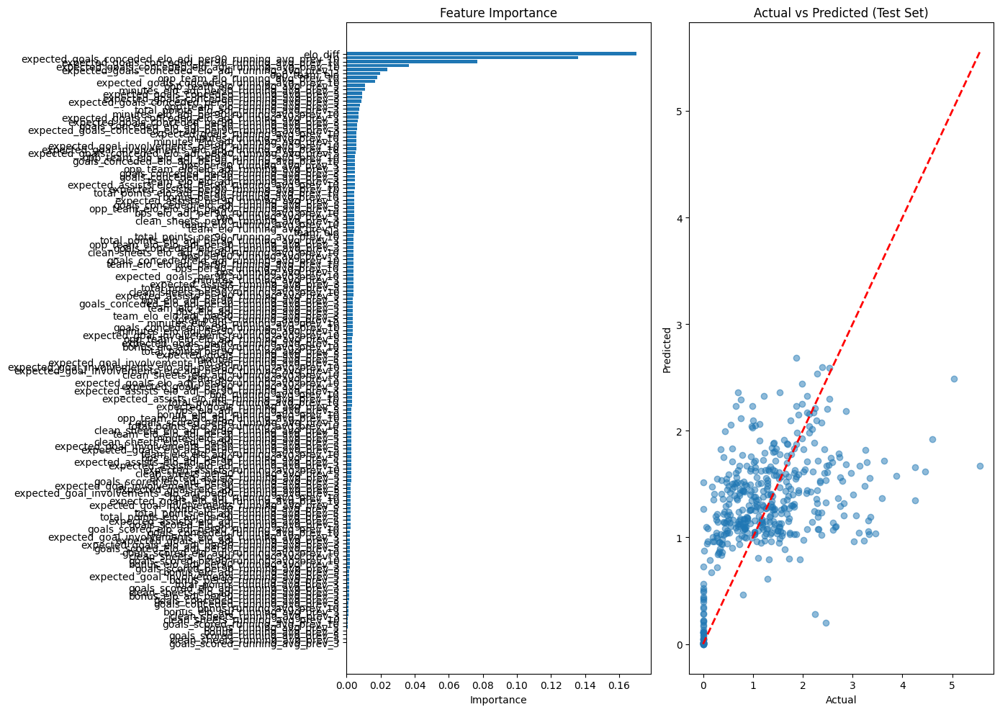

target=expected_goals_conceded_per90, MID_xGC_predictor
Cleaned df size: 10219/16507

Training Set Performance:
R² Score: 0.6306
RMSE: 0.5762
MAE: 0.4365

Test Set Performance:
R² Score: 0.4840
RMSE: 0.7182
MAE: 0.5280

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.238299
           expected_goals_conceded_per90_running_avg_prev_10    0.142157
                 expected_goals_conceded_running_avg_prev_10    0.085727
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.058737
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.054618
                                                opp_team_elo    0.022979
                             opp_team_elo_running_avg_prev_5    0.022891
                             opp_team_elo_running_avg_prev_3    0.022589
                            opp_team_elo_running_avg_prev_10    0.020422
                    minutes_el

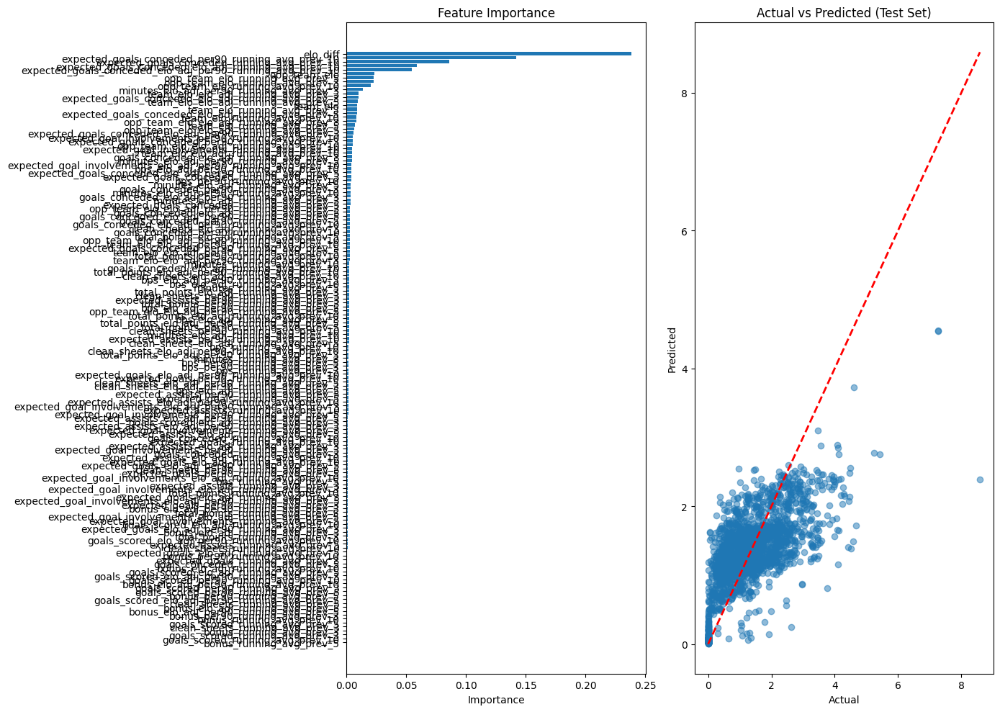

target=expected_goals_conceded_per90, DEF_xGC_predictor
Cleaned df size: 8825/14613

Training Set Performance:
R² Score: 0.6716
RMSE: 0.5474
MAE: 0.4131

Test Set Performance:
R² Score: 0.5020
RMSE: 0.6767
MAE: 0.4930

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.215778
           expected_goals_conceded_per90_running_avg_prev_10    0.199944
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.068396
                                                opp_team_elo    0.028507
                 expected_goals_conceded_running_avg_prev_10    0.028450
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.025921
                             opp_team_elo_running_avg_prev_5    0.024369
                            opp_team_elo_running_avg_prev_10    0.020980
                             opp_team_elo_running_avg_prev_3    0.019794
                     opp_team_e

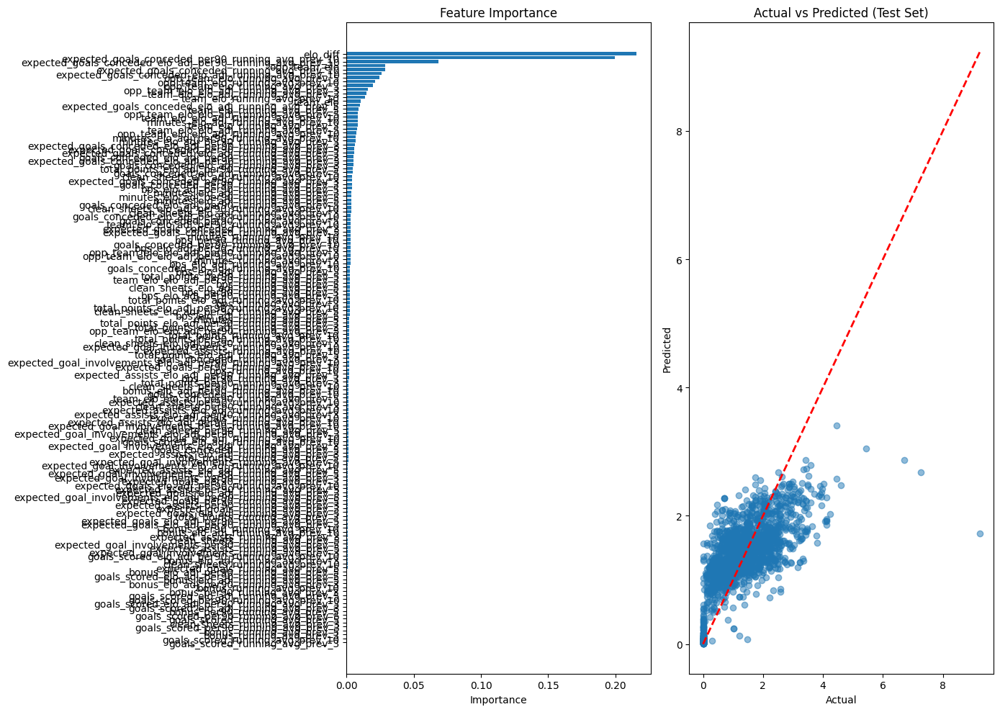

target=expected_goals_conceded_per90, GK_xGC_predictor
Cleaned df size: 2192/3571

Training Set Performance:
R² Score: 0.7372
RMSE: 0.4708
MAE: 0.3616

Test Set Performance:
R² Score: 0.3266
RMSE: 0.7879
MAE: 0.5906

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.196590
   expected_goals_conceded_elo_adj_per90_running_avg_prev_10    0.126134
           expected_goals_conceded_per90_running_avg_prev_10    0.090756
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.040666
                 expected_goals_conceded_running_avg_prev_10    0.026495
                                                opp_team_elo    0.023507
          expected_goals_conceded_elo_adj_running_avg_prev_5    0.019601
                            opp_team_elo_running_avg_prev_10    0.017514
                             opp_team_elo_running_avg_prev_5    0.014385
             goals_conceded_elo_a

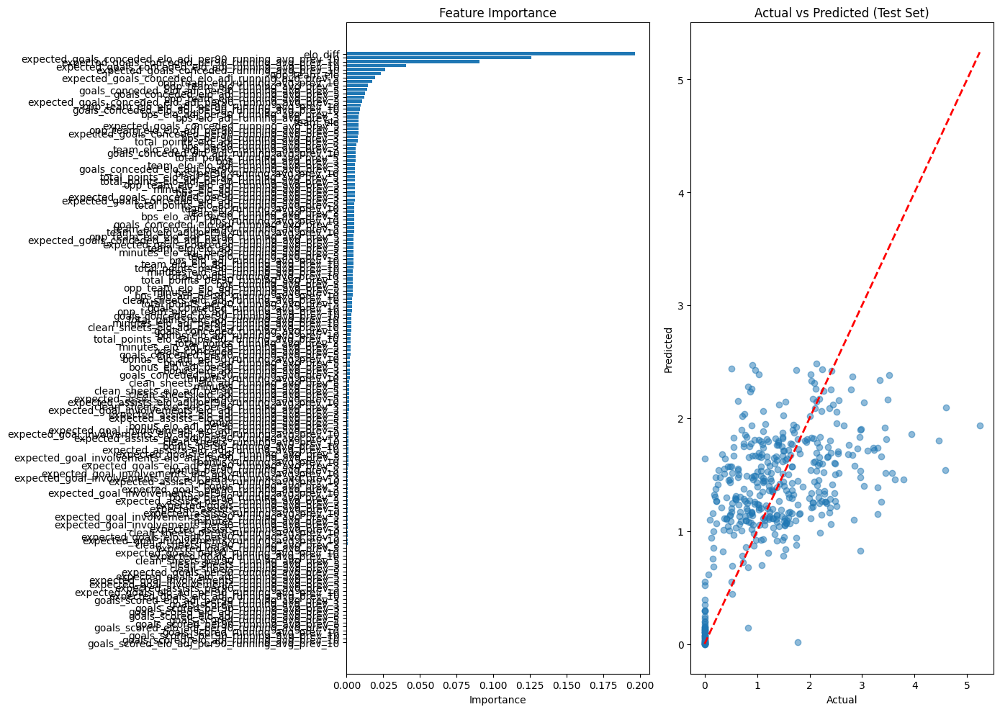

In [13]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=expected_goals_conceded_per90, FWD_xGC_predictor")
    FWD_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_xGC_predictor.fit()
    FWD_xGC_predictor.plot_results()

    print("target=expected_goals_conceded_per90, MID_xGC_predictor")
    MID_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_xGC_predictor.fit()
    MID_xGC_predictor.plot_results()
    
    print("target=expected_goals_conceded_per90, DEF_xGC_predictor")
    DEF_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_xGC_predictor.fit()
    DEF_xGC_predictor.plot_results()

    print("target=expected_goals_conceded_per90, GK_xGC_predictor")
    GK_xGC_predictor = FPLPredictor(
        data=df[filtered],
        target='expected_goals_conceded_per90',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_xGC_predictor.fit()
    GK_xGC_predictor.plot_results()

target=bps_per90, FWD_bps_predictor
Cleaned df size: 2287/4002

Training Set Performance:
R² Score: 0.6094
RMSE: 12.0609
MAE: 9.9013

Test Set Performance:
R² Score: -0.0134
RMSE: 19.9275
MAE: 15.7050

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.074741
                                                opp_team_elo    0.031579
                            opp_team_elo_running_avg_prev_10    0.025073
                    minutes_elo_adj_per90_running_avg_prev_5    0.019567
                             opp_team_elo_running_avg_prev_3    0.018757
                             opp_team_elo_running_avg_prev_5    0.016091
              clean_sheets_elo_adj_per90_running_avg_prev_10    0.012987
                    minutes_elo_adj_per90_running_avg_prev_3    0.012821
                          goals_conceded_running_avg_prev_10    0.012233
                   goals_conceded_elo_adj_runnin

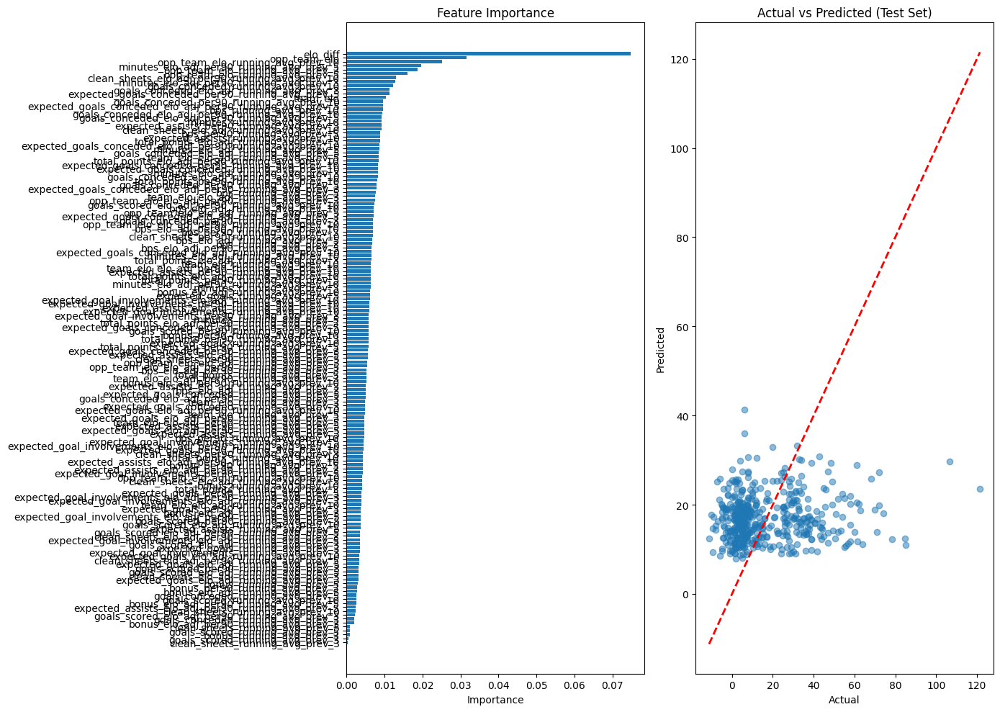

target=bps_per90, MID_bps_predictor
Cleaned df size: 10219/16507

Training Set Performance:
R² Score: 0.4098
RMSE: 8.9875
MAE: 6.9062

Test Set Performance:
R² Score: 0.0570
RMSE: 11.3873
MAE: 8.4130

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.102748
                             opp_team_elo_running_avg_prev_5    0.023320
                        expected_assists_running_avg_prev_10    0.023264
                                                opp_team_elo    0.023131
                            opp_team_elo_running_avg_prev_10    0.017873
                                     bps_running_avg_prev_10    0.017407
                expected_assists_elo_adj_running_avg_prev_10    0.015426
                                bps_per90_running_avg_prev_3    0.015329
                             opp_team_elo_running_avg_prev_3    0.015079
                  expected_assists_per90_running_

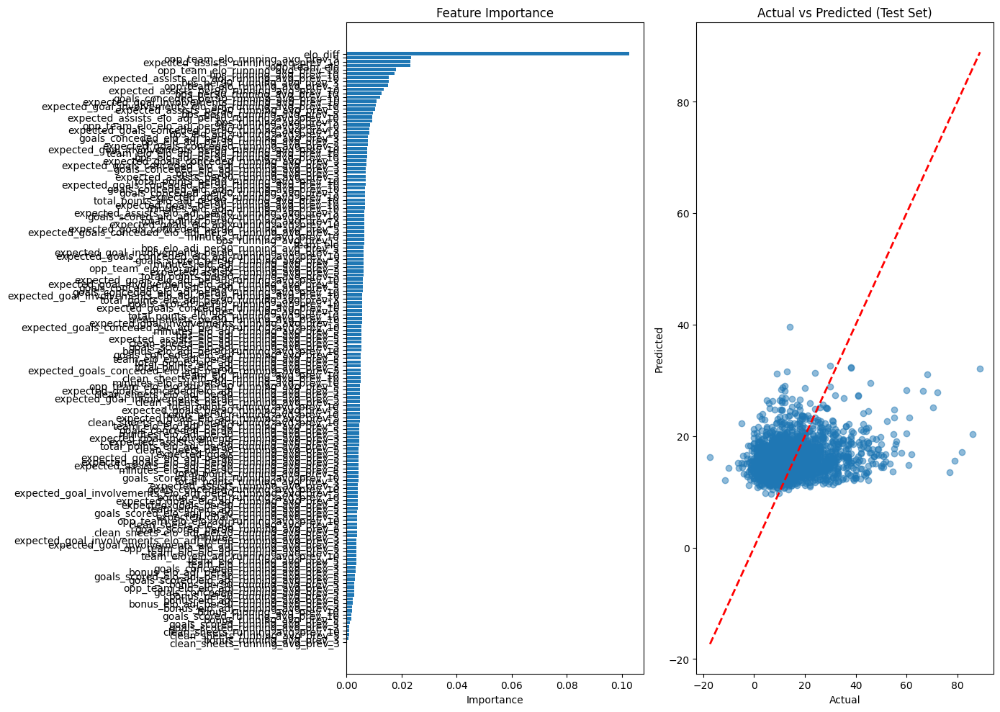

target=bps_per90, DEF_bps_predictor
Cleaned df size: 8825/14613

Training Set Performance:
R² Score: 0.5035
RMSE: 7.1541
MAE: 5.7481

Test Set Performance:
R² Score: 0.1602
RMSE: 9.0613
MAE: 7.2236

Feature Importance:
                                                     feature  importance
                                                    elo_diff    0.177990
                                                opp_team_elo    0.036770
                             opp_team_elo_running_avg_prev_5    0.024767
                             opp_team_elo_running_avg_prev_3    0.022511
                                team_elo_running_avg_prev_10    0.018865
                            opp_team_elo_running_avg_prev_10    0.018513
                                                    team_elo    0.017683
                               bps_per90_running_avg_prev_10    0.016615
                                 team_elo_running_avg_prev_3    0.012742
                        expected_assists_running_av

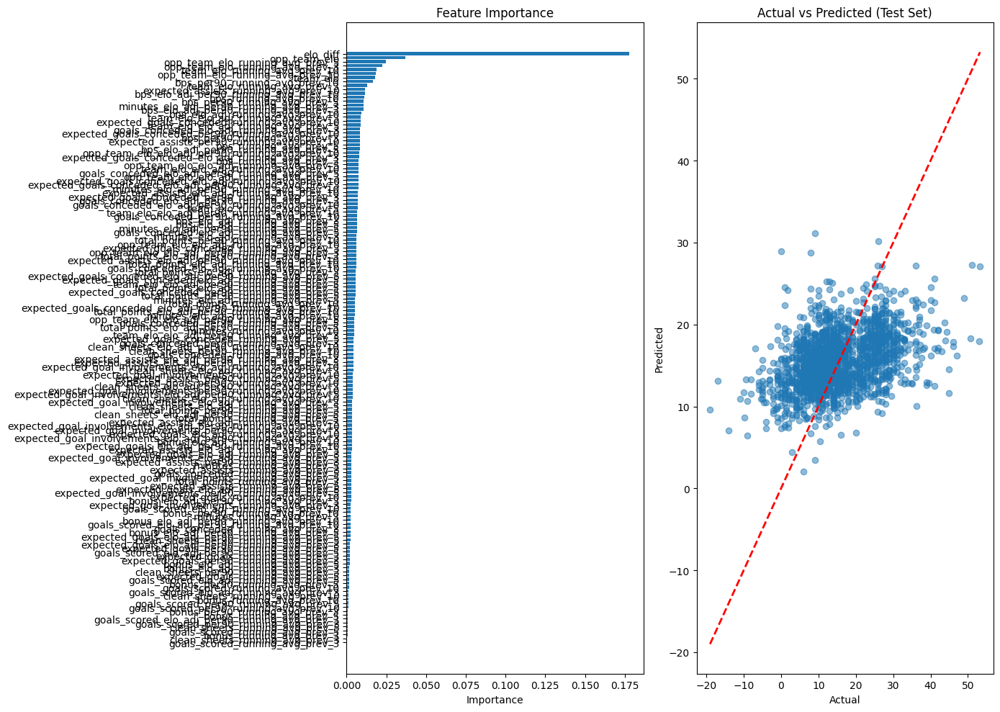

target=bps_per90, GK_bps_predictor
Cleaned df size: 2192/3571

Training Set Performance:
R² Score: 0.6862
RMSE: 5.1575
MAE: 4.2185

Test Set Performance:
R² Score: -0.0044
RMSE: 9.0754
MAE: 7.3271

Feature Importance:
                                                     feature   importance
                                                opp_team_elo 4.473658e-02
                            opp_team_elo_running_avg_prev_10 3.607519e-02
                               bps_per90_running_avg_prev_10 3.490676e-02
                             opp_team_elo_running_avg_prev_3 3.314715e-02
                                bps_per90_running_avg_prev_3 2.960018e-02
                             opp_team_elo_running_avg_prev_5 2.707950e-02
                                                    elo_diff 2.459910e-02
           expected_goals_conceded_per90_running_avg_prev_10 1.764328e-02
                                      bps_running_avg_prev_3 1.757795e-02
                                     bps_r

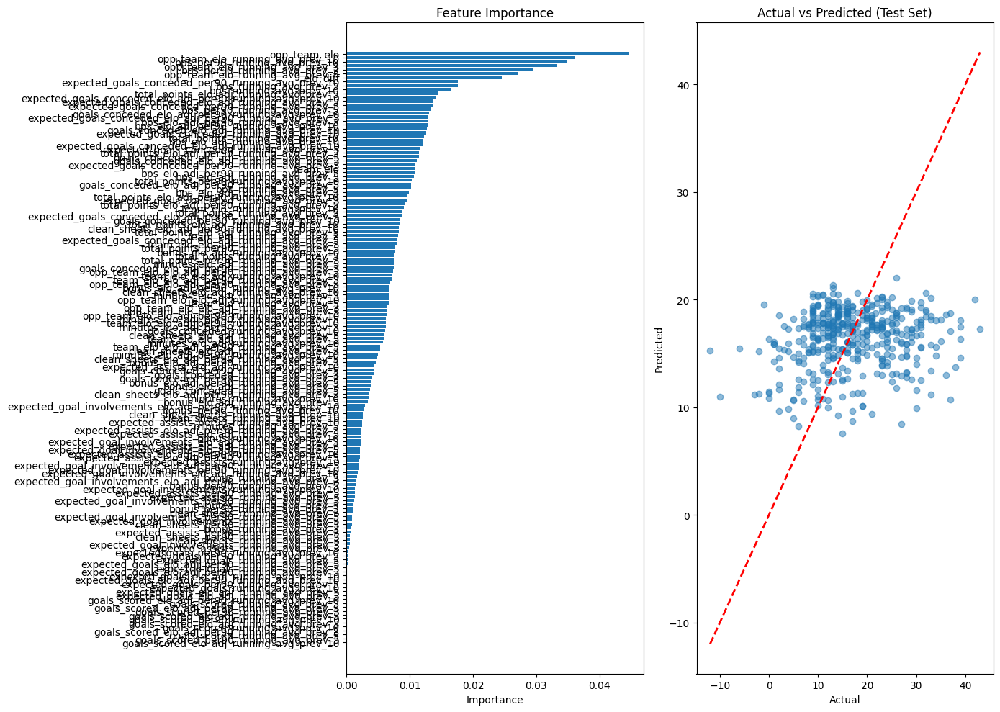

In [14]:
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>500)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=bps_per90, FWD_bps_predictor")
    FWD_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90', # try: 'bonus_per90'
        positions={'FWD'},
        columns_to_drop = cbi_defcon_cols)
    FWD_bps_predictor.fit()
    FWD_bps_predictor.plot_results()

    print("target=bps_per90, MID_bps_predictor")
    MID_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'MID'},
        columns_to_drop = cbi_defcon_cols)
    MID_bps_predictor.fit()
    MID_bps_predictor.plot_results()
    
    print("target=bps_per90, DEF_bps_predictor")
    DEF_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'DEF'},
        columns_to_drop = cbi_defcon_cols)
    DEF_bps_predictor.fit()
    DEF_bps_predictor.plot_results()

    print("target=bps_per90, GK_bps_predictor")
    GK_bps_predictor = FPLPredictor(
        data=df[filtered],
        target='bps_per90',
        positions={'GK'},
        columns_to_drop = cbi_defcon_cols)
    GK_bps_predictor.fit()
    GK_bps_predictor.plot_results()

target=saves_per90, GK_saves_predictor
Cleaned df size: 139/3741

Training Set Performance:
R² Score: 0.8466
RMSE: 0.6304
MAE: 0.5299

Test Set Performance:
R² Score: -0.2446
RMSE: 1.6428
MAE: 1.3530

Feature Importance:
                                                     feature  importance
                                 team_elo_running_avg_prev_5    0.043467
                             opp_team_elo_running_avg_prev_5    0.036065
                            opp_team_elo_running_avg_prev_10    0.026774
                                recoveries_per90_alltime_avg    0.022846
                                                    elo_diff    0.022340
                                       cbi_per90_alltime_avg    0.020067
            goals_conceded_elo_adj_per90_running_avg_prev_10    0.019847
                                                opp_team_elo    0.019837
                     saves_elo_adj_per90_running_avg_prev_10    0.019613
                             opp_team_elo_running

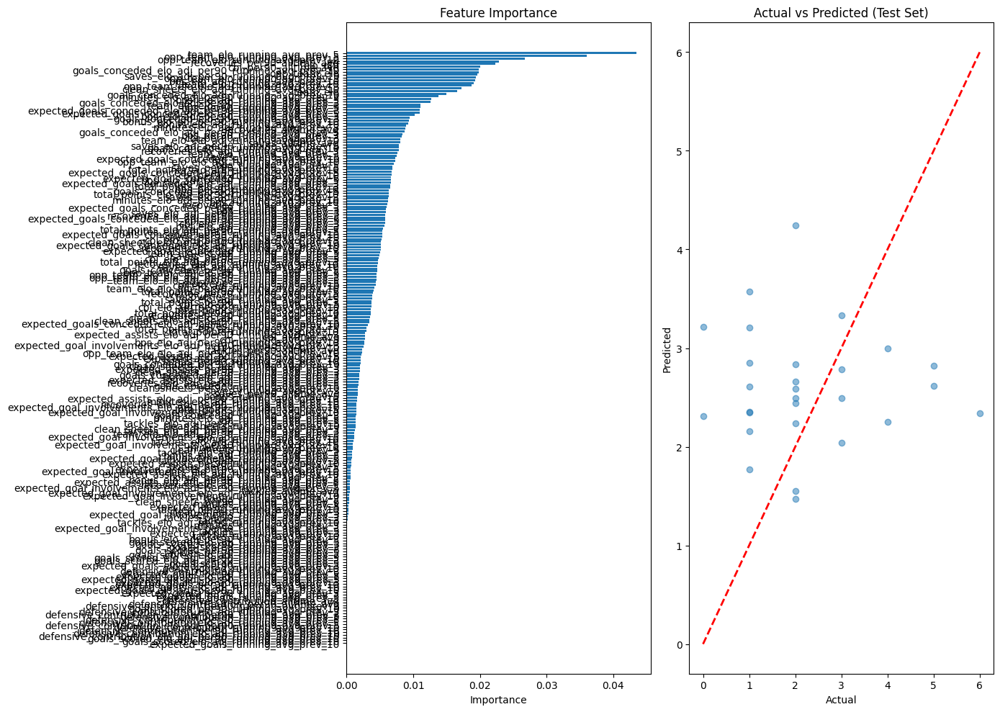

In [15]:
#shots saved
filtered = (df['minutes']>45)&(df['player_season_minutes_total']>0)#&(df['total_points']<15)

if __name__ == "__main__":
    
    print("target=saves_per90, GK_saves_predictor")
    GK_saves_predictor = FPLPredictor(
    data=df[filtered],
    target='saves_per90',
    positions={'GK'})
    GK_saves_predictor.fit()
    GK_saves_predictor.plot_results()

target=defensive_contribution_per90, FWD_defcon_predictor
Cleaned df size: 146/4619

Training Set Performance:
R² Score: 0.8391
RMSE: 0.9500
MAE: 0.7109

Test Set Performance:
R² Score: -0.2150
RMSE: 3.4743
MAE: 2.6057

Feature Importance:
                                                     feature  importance
                         expected_assists_running_avg_prev_3    0.082095
                                                    elo_diff    0.034801
                                                opp_team_elo    0.024836
     defensive_contribution_elo_adj_per90_running_avg_prev_3    0.024572
                                                    team_elo    0.017502
                   minutes_elo_adj_per90_running_avg_prev_10    0.016167
                   team_elo_elo_adj_per90_running_avg_prev_3    0.015605
            expected_goals_conceded_per90_running_avg_prev_3    0.013160
                             opp_team_elo_running_avg_prev_5    0.012800
                            op

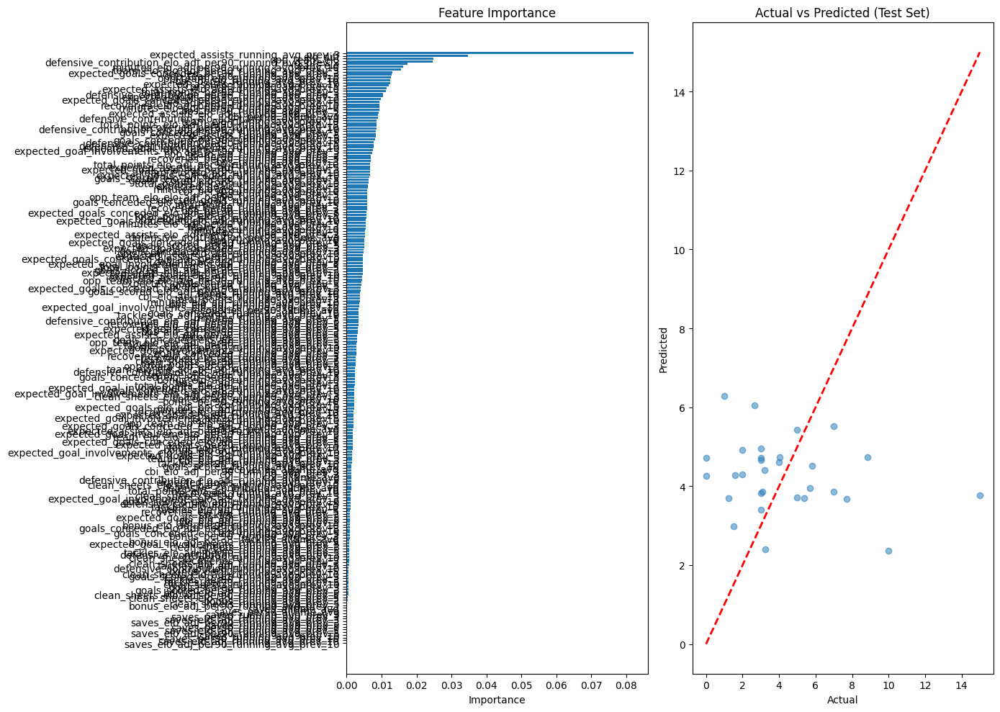

target=defensive_contribution_per90, MID_defcon_predictor
Cleaned df size: 731/18994

Training Set Performance:
R² Score: 0.8588
RMSE: 1.5047
MAE: 1.2059

Test Set Performance:
R² Score: 0.1142
RMSE: 3.8581
MAE: 3.0757

Feature Importance:
                                                     feature  importance
      expected_goal_involvements_elo_adj_running_avg_prev_10    0.048344
                           tackles_per90_running_avg_prev_10    0.027505
                          expected_goals_running_avg_prev_10    0.019892
                   tackles_elo_adj_per90_running_avg_prev_10    0.015262
                            tackles_per90_running_avg_prev_5    0.015041
                                                opp_team_elo    0.014750
                                                    elo_diff    0.014104
              total_points_elo_adj_per90_running_avg_prev_10    0.012458
                       cbi_elo_adj_per90_running_avg_prev_10    0.012247
                    tackles_el

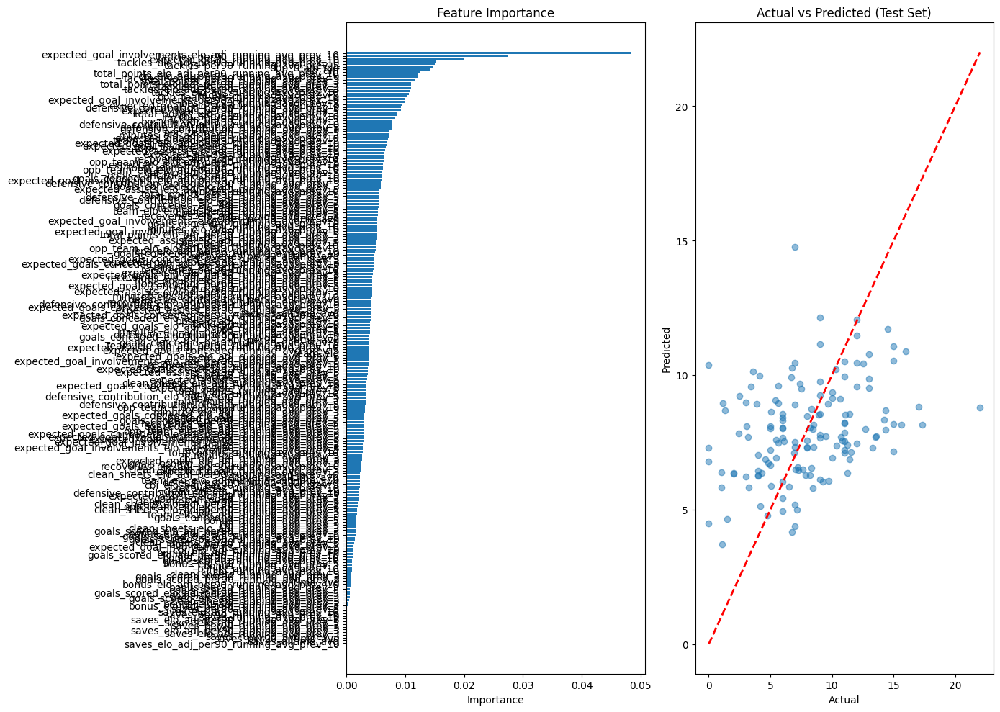

target=defensive_contribution_per90, DEF_defcon_predictor
Cleaned df size: 602/16062

Training Set Performance:
R² Score: 0.8295
RMSE: 1.5756
MAE: 1.2510

Test Set Performance:
R² Score: 0.1541
RMSE: 3.3717
MAE: 2.6952

Feature Importance:
                                                     feature  importance
                                                opp_team_elo    0.030525
         expected_goals_conceded_elo_adj_running_avg_prev_10    0.029544
                                                    elo_diff    0.028794
                                             cbi_alltime_avg    0.027186
                                     cbi_running_avg_prev_10    0.024558
                                      cbi_running_avg_prev_5    0.022074
                                      cbi_running_avg_prev_3    0.021799
                             opp_team_elo_running_avg_prev_3    0.017332
               opp_team_elo_elo_adj_per90_running_avg_prev_5    0.016532
    expected_goals_conceded_el

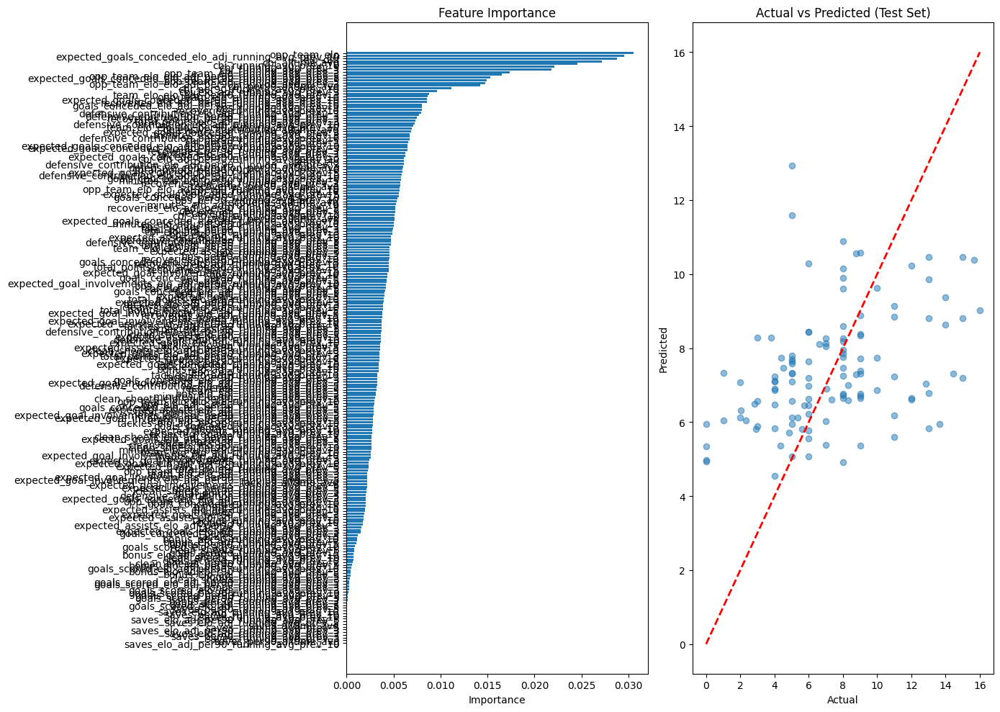

In [16]:
# >10 defcon (CBIT) for a defender
# >12 defcon (CBIT+R) for mid or fwd
filtered = (df['minutes']>30)&(df['player_season_minutes_total']>0)

if __name__ == "__main__":
    
    print("target=defensive_contribution_per90, FWD_defcon_predictor")
    FWD_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'FWD'})
    FWD_defcon_predictor.fit()
    FWD_defcon_predictor.plot_results()

    print("target=defensive_contribution_per90, MID_defcon_predictor")
    MID_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'MID'})
    MID_defcon_predictor.fit()
    MID_defcon_predictor.plot_results()

    print("target=defensive_contribution_per90, DEF_defcon_predictor")
    DEF_defcon_predictor = FPLPredictor(
    data=df[filtered],
    target='defensive_contribution_per90',
    positions={'DEF'})
    DEF_defcon_predictor.fit()
    DEF_defcon_predictor.plot_results()

Goals conceded per 90
Estimated λ (mean goals per match): 1.340


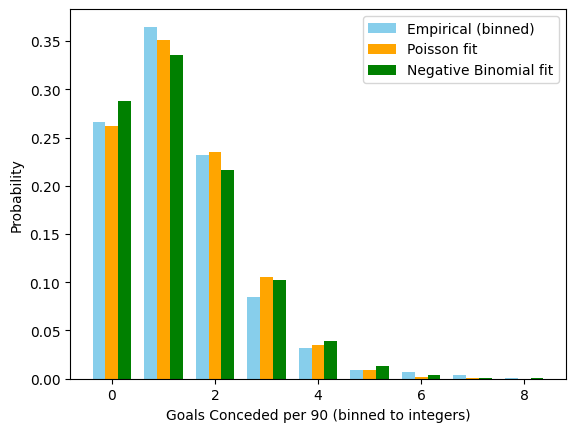

Mean: 1.332, Variance: 1.523
Overdispersion ratio (Var/Mean): 1.143
✅ Poisson assumption looks reasonable.
P(X < 1 goal) = 0.262


In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("Goals conceded per 90")

# Compute xGC per 90
df['xgc_p90'] = (df['expected_goals_conceded'] / df['minutes']) * 90

# Filter to reasonable samples
data = df[(df['minutes'] > 0) & (df['xgc_p90'] < 8)]['xgc_p90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean goals per match): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('Goals Conceded per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")

# --- Example probability ---
p_less_than_1 = poisson.cdf(0, mu=lambda_hat)
print(f"P(X < 1 goal) = {p_less_than_1:.3f}")


Mids & Forwards
Estimated λ (mean defcon per 90): 8.240


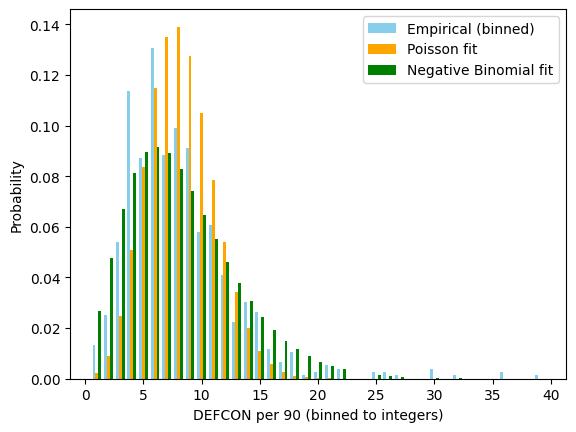

Mean: 8.235, Variance: 23.249
Overdispersion ratio (Var/Mean): 2.823
⚠️ Likely overdispersed → Negative Binomial may fit better.


In [18]:
#Test if defcon_p90 is neg binom distributed

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("Mids & Forwards")

# Filter to reasonable samples
data = df[(df['minutes'] > 0)
          & (df['defensive_contribution_per90'] > 0) 
          & (df['defensive_contribution_per90'] < 40)
          & (df['position'].isin(['DEF']))]['defensive_contribution_per90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean defcon per 90): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('DEFCON per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")


GK saves per 90
Estimated λ (mean defcon per 90): 3.218


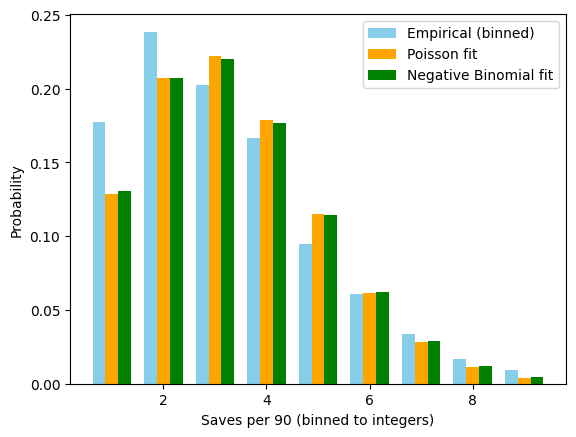

Mean: 3.218, Variance: 3.287
Overdispersion ratio (Var/Mean): 1.022
✅ Poisson assumption looks reasonable.


In [19]:
#Test if saves_p90 is neg binom distributed

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, nbinom
print("GK saves per 90")

# Filter to reasonable samples
data = df[#(df['minutes'] > 0)
          (df['saves_per90'] > 0) 
          & (df['saves_per90'] < 10)
          & (df['position'].isin(['GK']))]['saves_per90']

# Estimate λ
lambda_hat = np.mean(data)
print(f"Estimated λ (mean defcon per 90): {lambda_hat:.3f}")

# --- BINNING into discrete Poisson-like counts ---
binned = np.round(data).astype(int)
binned = np.clip(binned, 0, None)

# Empirical frequencies
values, counts = np.unique(binned, return_counts=True)
prob_empirical = counts / counts.sum()

# --- Poisson PMF ---
poisson_pmf = poisson.pmf(values, mu=lambda_hat)

# --- Negative Binomial PMF (method of moments) ---
mean_val = np.mean(binned)
var_val = np.var(binned, ddof=1)

if var_val > mean_val:
    r = (mean_val ** 2) / (var_val - mean_val)
    p = r / (r + mean_val)
    negbin_pmf = nbinom.pmf(values, n=r, p=p)
else:
    negbin_pmf = np.zeros_like(values)
    print("Variance ≤ Mean → NB undefined, skipping NB plot.")

# --- Plot ---
plt.bar(values - 0.25, prob_empirical, width=0.25, label='Empirical (binned)', color='skyblue')
plt.bar(values, poisson_pmf, width=0.25, label='Poisson fit', color='orange')
plt.bar(values + 0.25, negbin_pmf, width=0.25, label='Negative Binomial fit', color='green')
plt.xlabel('Saves per 90 (binned to integers)')
plt.ylabel('Probability')
plt.legend()
plt.show()

# --- Dispersion diagnostics ---
overdispersion_ratio = var_val / mean_val
print(f"Mean: {mean_val:.3f}, Variance: {var_val:.3f}")
print(f"Overdispersion ratio (Var/Mean): {overdispersion_ratio:.3f}")

if overdispersion_ratio > 1.2:
    print("⚠️ Likely overdispersed → Negative Binomial may fit better.")
else:
    print("✅ Poisson assumption looks reasonable.")


                                 OLS Regression Results                                
Dep. Variable:                  bonus   R-squared (uncentered):                   0.446
Model:                            OLS   Adj. R-squared (uncentered):              0.446
Method:                 Least Squares   F-statistic:                          3.122e+04
Date:                Mon, 10 Nov 2025   Prob (F-statistic):                        0.00
Time:                        18:41:32   Log-Likelihood:                         -36627.
No. Observations:               38831   AIC:                                  7.326e+04
Df Residuals:                   38830   BIC:                                  7.327e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

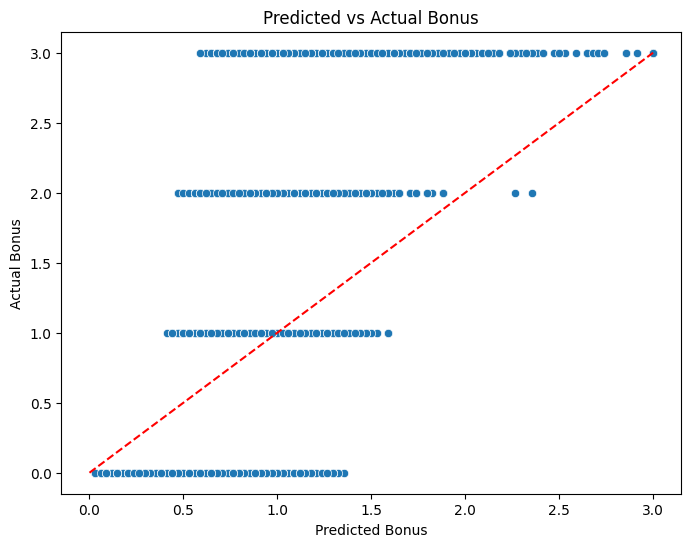

Actual Bonus       0.0       1.0       2.0       3.0
Position                                            
DEF           0.459423  0.232840  1.111908  1.954157
FWD           0.332705  0.201598  1.049845  1.712419
GK            0.492185  0.247359  1.120003  2.014407
GKP                NaN       NaN       NaN       NaN
MID           0.393360  0.248517  1.052256  1.831143


In [20]:
# Generalize the relationship between bps & bonus points
import statsmodels.formula.api as smf
filtered = (df['minutes']>45) & (df['bonus']>=0) & (df['bps']>0) & (df['position'].isin(['GK','DEF','MID','FWD']))
# df['bonus_sq'] = df['bonus']**2

model = smf.ols('bonus ~ bps -1', data=df[filtered]).fit()
print(model.summary())

df['bonus_pred'] = model.predict(df[filtered])
df['bonus_pred'] = np.clip(df['bonus_pred'], 0, 3) # clip prediction to 3

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(x='bonus_pred', y='bonus', data=df)
plt.plot([df['bonus'].min(), df['bonus'].max()],
         [df['bonus'].min(), df['bonus'].max()],
         color='red', linestyle='--')  # 45-degree line
plt.xlabel('Predicted Bonus')
plt.ylabel('Actual Bonus')
plt.title('Predicted vs Actual Bonus')
plt.show()

import pandas as pd
import numpy as np

# Function to calculate RMSE
def rmse(actual, predicted):
    return np.sqrt(np.mean((actual - predicted) ** 2))

# Group by position and actual bonus, then calculate RMSE
rmse_table = df.groupby(['position', 'bonus']).apply(lambda x: rmse(x['bonus'], x['bonus_pred']))

# Convert to DataFrame
rmse_table = rmse_table.reset_index()
rmse_table.columns = ['Position', 'Actual Bonus', 'RMSE']

pivot_rmse = rmse_table.pivot(index='Position', columns='Actual Bonus', values='RMSE')
print(pivot_rmse)


In [21]:
prediction_data = df[(df['season']==20252026)
                     &(df['event']>=stats_current_gameweek)]

In [22]:
def predict_target_vectorized(df, model_dict, col_name):
    preds = []
    
    for pos, model in model_dict.items():
        subset = df[df['position'] == pos]
        if not subset.empty:
            pos_preds = model.predict_new(subset)
            temp = subset.copy()
            temp[col_name] = pos_preds
            preds.append(temp)
    
    if not preds:
        # If no positions matched at all
        return pd.Series(index=df.index, dtype=float)
    
    result = pd.concat(preds)
    
    # Safely align back to original DataFrame
    output = pd.Series(index=df.index, dtype=float)
    output.loc[result.index] = result[col_name]
    return output

In [23]:
target_col_name = 'mins_pred'
mins_model_dict = {'FWD': FWD_mins_predictor, 'MID': MID_mins_predictor, 'DEF': DEF_mins_predictor, 'GK': GK_mins_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, mins_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_27504\2521843321.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, mins_model_dict, col_name=target_col_name)


count    13230.000000
mean        43.977748
std         28.066652
min          0.921376
25%         17.811065
50%         42.698365
75%         73.135879
max         88.440312
Name: mins_pred, dtype: float64

In [24]:
target_col_name = 'xgp90_pred'
xg_model_dict = {'FWD': FWD_xG_predictor, 'MID': MID_xG_predictor, 'DEF': DEF_xG_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xg_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_27504\365369552.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xg_model_dict, col_name=target_col_name)


count    12390.000000
mean         0.152878
std          0.146631
min          0.014885
25%          0.050335
50%          0.104121
75%          0.195401
max          1.118666
Name: xgp90_pred, dtype: float64

In [25]:
target_col_name = 'xap90_pred'
xA_model_dict = {'FWD': FWD_xA_predictor, 'MID': MID_xA_predictor, 'DEF': DEF_xA_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xA_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_27504\4144355699.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xA_model_dict, col_name=target_col_name)


count    12390.000000
mean         0.087591
std          0.053805
min          0.007396
25%          0.048307
50%          0.077807
75%          0.113128
max          0.368082
Name: xap90_pred, dtype: float64

In [26]:
target_col_name = 'xgcp90_pred'
xGC_model_dict = {'FWD': FWD_xGC_predictor, 'MID': MID_xGC_predictor, 'DEF': DEF_xGC_predictor, 'GK':GK_xGC_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xGC_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_27504\682035545.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, xGC_model_dict, col_name=target_col_name)


count    13230.000000
mean         1.464430
std          0.387859
min          0.361116
25%          1.186578
50%          1.434445
75%          1.707393
max          3.644583
Name: xgcp90_pred, dtype: float64

In [27]:
target_col_name = 'xbpsp90_pred'
bps_model_dict = {'FWD': FWD_bps_predictor, 'MID': MID_bps_predictor, 'DEF': DEF_bps_predictor, 'GK':GK_bps_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, bps_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_27504\3051138591.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, bps_model_dict, col_name=target_col_name)


count    13230.000000
mean        15.995748
std          3.766323
min          6.101852
25%         13.473429
50%         15.494445
75%         17.834293
max         48.960432
Name: xbpsp90_pred, dtype: float64

In [28]:
target_col_name = 'xsavesp90_pred'
saves_model_dict = {'GK':GK_saves_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, saves_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_27504\803536942.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, saves_model_dict, col_name=target_col_name)


count    840.000000
mean       2.610785
std        0.478643
min        1.540000
25%        2.350153
50%        2.563214
75%        2.762857
max        4.415000
Name: xsavesp90_pred, dtype: float64

In [29]:
target_col_name = 'xdefconp90_pred'
defcon_model_dict = {'FWD': FWD_defcon_predictor, 'MID': MID_defcon_predictor, 'DEF': DEF_defcon_predictor}
prediction_data[target_col_name] = predict_target_vectorized(prediction_data, defcon_model_dict, col_name=target_col_name)
prediction_data[target_col_name].describe()

C:\Users\chris\AppData\Local\Temp\ipykernel_27504\2777375241.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data[target_col_name] = predict_target_vectorized(prediction_data, defcon_model_dict, col_name=target_col_name)


count    12390.000000
mean         7.658154
std          2.052067
min          2.015790
25%          6.328704
50%          7.725173
75%          9.139714
max         16.279108
Name: xdefconp90_pred, dtype: float64

In [30]:
prediction_data[prediction_data['position']=='MID'].head()[["player_name_id","element","value","team_name","position","season","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xgcp90_pred'
    ]]

,player_name_id,element,value,team_name,position,season,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xgcp90_pred
129704,Antoni Milambo,122.0,53.0,Brentford,MID,20252026.0,9.0,Liverpool,1219.276163,2.312796,0.038056,0.054219,1.999259
129708,Antoni Milambo,122.0,53.0,Brentford,MID,20252026.0,10.0,Crystal Palace,1091.589784,2.397267,0.041630,0.043968,1.815293
129712,Antoni Milambo,122.0,53.0,Brentford,MID,20252026.0,11.0,Newcastle,1096.205675,2.397267,0.041630,0.048401,1.906077
129716,Antoni Milambo,122.0,53.0,Brentford,MID,20252026.0,12.0,Brighton,1092.186587,2.397267,0.041630,0.043968,1.857582
129723,Antoni Milambo,122.0,53.0,Brentford,MID,20252026.0,13.0,Burnley,899.744173,2.497173,0.047944,0.132724,1.156106


In [31]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek)
    &(prediction_data['mins_pred']>0)
    ][["player_name_id","element","value","team_name","position","season","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xgcp90_pred'
    ]].sort_values(by='xgp90_pred',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,season,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xgcp90_pred
137182,Jean-Philippe Mateta,283.0,76.0,Crystal Palace,FWD,20252026.0,11.0,Brighton,1091.930861,75.156207,0.831498,0.097274,1.439831
139803,Lukas Nmecha,365.0,50.0,Leeds,FWD,20252026.0,11.0,Nott'm Forest,1012.476487,26.147332,0.740150,0.129704,2.088553
133784,Eli Junior Kroupi,100.0,45.0,Bournemouth,FWD,20252026.0,11.0,Aston Villa,1129.223525,48.211249,0.692596,0.093166,1.942557
138598,Kai Havertz,30.0,73.0,Arsenal,FWD,20252026.0,11.0,Sunderland,1036.153451,2.494811,0.691452,0.099362,1.089809
130825,Arnaud Kalimuendo,696.0,60.0,Nott'm Forest,FWD,20252026.0,11.0,Leeds,930.336223,6.119132,0.677705,0.102167,1.390847
132116,Charalampos Kostoulas,181.0,48.0,Brighton,FWD,20252026.0,11.0,Crystal Palace,1100.817637,31.310173,0.660576,0.072149,1.991340
145634,Viktor GyÃ¶keres,666.0,90.0,Arsenal,FWD,20252026.0,11.0,Sunderland,1036.153451,61.683005,0.623793,0.132706,0.881978
133441,Dominic Calvert-Lewin,691.0,55.0,Leeds,FWD,20252026.0,11.0,Nott'm Forest,1012.476487,78.123632,0.615364,0.048827,1.599869
139534,Liam Delap,250.0,62.0,Chelsea,FWD,20252026.0,11.0,Wolves,932.474999,4.404357,0.597651,0.096019,1.102671
145906,William Osula,500.0,55.0,Newcastle,FWD,20252026.0,11.0,Brentford,1055.481291,17.895905,0.595350,0.113128,1.797602


In [32]:
import pandas as pd
from scipy.stats import nbinom

def calculate_negbinom_parameters(position_list, df):

    # 1. Calculate mean and variance
    filtered = (df['minutes'] > 0) & (df['defensive_contribution_per90'] > 0) & (df['defensive_contribution_per90'] < 40) & (df['position'].isin(position_list))
    mean = df[filtered]['defensive_contribution_per90'].mean()
    variance = df[filtered]['defensive_contribution_per90'].var()
    # r = number of successes
    r = (mean**2) / (variance - mean)
    # p = success probability
    p = r / (r + mean)
    return r,p

In [33]:
from scipy.stats import poisson
import numpy as np

def expected_score(mu, max_events=10, rule=None, points_per_n=None, points_value=None):
    """
    Calculate the expected score given an average event rate (mu)
    using a Poisson model.

    Parameters
    ----------
    mu : float
        Expected number of events (e.g., goals conceded, shots saved).
    max_events : int
        Maximum number of discrete events to sum over.
    rule : callable, optional
        Function that maps event count -> points. Example: lambda k: -np.floor(k / 2)
    points_per_n : int, optional
        For simple rules: number of events required for one point (e.g. 3 shots saved = 1 pt)
    points_value : float, optional
        Value of that one point (e.g. +1 for shots saved, -1 for goals conceded)

    Returns
    -------
    float
        Expected points based on Poisson-distributed event counts.
    """
    array = np.arange(0, max_events + 1)
    probs = poisson.pmf(array, mu)

    if rule is not None:
        scores = np.array([rule(k) for k in array])
    elif points_per_n is not None and points_value is not None:
        # General simple rule: 1 point_value for every n events
        scores = np.floor(array / points_per_n) * points_value
    else:
        raise ValueError("You must provide either a rule function or both points_per_n and points_value.")

    return np.sum(scores * probs)


In [34]:
scoring_dict = {
    "FWD": {'xgp90_pred': 4, 'xap90_pred': 3, 'xgcp90_pred': 0, 'xgc_ss':0, 'defcon':2},
    "MID": {'xgp90_pred': 5, 'xap90_pred': 3, 'xgcp90_pred': 1, 'xgc_ss':0, 'defcon':2},
    "DEF": {'xgp90_pred': 6, 'xap90_pred': 3, 'xgcp90_pred': 4, 'xgc_ss':-1, 'defcon':2},
    "GK":  {'xgp90_pred': 10, 'xap90_pred': 3, 'xgcp90_pred': 4, 'xgc_ss':-1, 'defcon':2}
}

def scoring(x, scoring_dict, points_type, negbinom_rp_dict=None):
    mins_factor = x['mins_pred']/90
    if points_type == 'mins':
        if pd.isna(x['mins_pred']):
            return 0
        elif x['mins_pred'] >= 60:
            return 2
        elif x['mins_pred'] > 0:
            return 1
        else:
            return 0
    if points_type == 'goals':
        goals_points = mins_factor * x['xgp90_pred'] * scoring_dict[x['position']]['xgp90_pred']
        return goals_points
    if points_type == 'assists':
        assist_points = mins_factor * x['xap90_pred'] * scoring_dict[x['position']]['xap90_pred']
        return assist_points
    if points_type == 'clean_sheets':
        p_less_than_1 = poisson.cdf(0, mu=x['xgcp90_pred'])
        cs_points = p_less_than_1 * scoring_dict[x['position']]['xgcp90_pred']
        return cs_points
    
    if points_type == 'shots_saved': 
        if x['position'] == 'GK':
            saves_points = expected_score(mu=x['xsavesp90_pred'],  # expected shots saved per 90
                                   max_events=15,
                                   points_per_n=3, #for every 3 shots saved
                                   points_value=1) #scores 1 point
            return saves_points
        else:
            return 0
        
    if points_type == 'goals_conceded':
        if x['position'] in ['DEF','GK']:
            gc_points = expected_score(mu=x['xgcp90_pred'], 
                                   max_events=10, 
                                   points_per_n=2, #for every 2 goals conceded 
                                   points_value=-1) #scores -1 points 
            return gc_points
        else:
            return 0

    if points_type == 'defcon':
        pos = x['position']
        if pos in ['MID','FWD']:
            r = negbinom_rp_dict[pos]['r']
            p = negbinom_rp_dict[pos]['p']
            k = 12
            prob_more_than_12 = 1 - nbinom.cdf(k, r, p)
            defcon_points = prob_more_than_12 * scoring_dict[pos]['defcon']
            return defcon_points
        elif pos == 'DEF':
            r = negbinom_rp_dict[pos]['r']
            p = negbinom_rp_dict[pos]['p']
            k = 10
            prob_more_than_12 = 1 - nbinom.cdf(k, r, p)
            defcon_points = prob_more_than_12 * scoring_dict[pos]['defcon']
            return defcon_points
        else: return 0

    if points_type == 'bonus':
        return x['xbpsp90_pred']*0.0294 # ols regression coefficient

prediction_data['xpoints_mins'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='mins'), axis=1)
prediction_data['xpoints_goals'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals'), axis=1)
prediction_data['xpoints_assists'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='assists'), axis=1)
prediction_data['xpoints_clean_sheets'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='clean_sheets'), axis=1)

prediction_data['xpoints_shots_saved'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='shots_saved'), axis=1)
prediction_data['xpoints_goals_conceded'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals_conceded'), axis=1)

def_r,def_p = calculate_negbinom_parameters(['DEF'], df)
mid_r,mid_p = calculate_negbinom_parameters(['MID'], df)
fwd_r,fwd_p = calculate_negbinom_parameters(['FWD'], df)
rp_dict = {'DEF':{'r':def_r,'p':def_p},'MID':{'r':mid_r,'p':mid_p},'FWD':{'r':fwd_r,'p':fwd_p}}
prediction_data['xpoints_defcon'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='defcon', negbinom_rp_dict=rp_dict), axis=1)
prediction_data['xpoints_bonus'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='bonus'), axis=1)

prediction_data['xpoints'] = prediction_data[['xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets',
                                              'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus']].sum(axis=1, skipna=True)

C:\Users\chris\AppData\Local\Temp\ipykernel_27504\282654768.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data['xpoints_mins'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='mins'), axis=1)
C:\Users\chris\AppData\Local\Temp\ipykernel_27504\282654768.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prediction_data['xpoints_goals'] = prediction_data.apply(lambda x: scoring(x, scoring_dict, points_type='goals'), axis=1)
C:\Users\chris\AppData\Local\Temp\ipykernel_

In [35]:
predictions = prediction_data[['player_name_id', 'team_name','team_elo','element','position','opp_team_name','opp_team_elo', 'season', 'value', 'event',
                       'mins_pred', 'xgp90_pred', 'xap90_pred', 'xgcp90_pred',
                       'xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets','xpoints_shots_saved',
                       'xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                       'xpoints']]
predictions

,player_name_id,team_name,team_elo,element,position,opp_team_name,opp_team_elo,season,value,event,...,xgcp90_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
129676,Aaron Hickey,Brentford,1050.193538,116.0,DEF,Liverpool,1219.276163,20252026.0,40.0,9.0,...,2.257851,1,0.086004,0.019314,0.418300,0.000000,-0.881530,0.550928,0.327607,1.520623
129677,Aaron Hickey,Brentford,1064.709144,116.0,DEF,Crystal Palace,1091.589784,20252026.0,40.0,10.0,...,1.780932,1,0.013442,0.005294,0.673924,0.000000,-0.647548,0.550928,0.371660,1.967700
129678,Aaron Hickey,Brentford,1055.481291,116.0,DEF,Newcastle,1096.205675,20252026.0,40.0,11.0,...,1.825362,1,0.013442,0.005294,0.644637,0.000000,-0.669156,0.550928,0.387967,1.933111
129679,Aaron Hickey,Brentford,1066.648094,116.0,DEF,Brighton,1092.186587,20252026.0,40.0,12.0,...,1.784111,1,0.013442,0.005294,0.671786,0.000000,-0.649092,0.550928,0.371660,1.964017
129681,Aaron Hickey,Brentford,1066.648094,116.0,DEF,Burnley,899.744173,20252026.0,40.0,13.0,...,1.170168,1,0.013956,0.005774,1.241259,0.000000,-0.359158,0.550928,0.527757,2.980516
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146417,ÄorÄe PetroviÄ,Bournemouth,1068.336869,67.0,GK,Leeds,922.657325,20252026.0,45.0,34.0,...,1.164956,2,NaN,NaN,1.247746,0.361794,-0.356804,0.000000,0.489868,3.742604
146418,ÄorÄe PetroviÄ,Bournemouth,1068.336869,67.0,GK,Crystal Palace,1100.561911,20252026.0,45.0,35.0,...,1.405445,2,NaN,NaN,0.981031,0.402669,-0.467759,0.000000,0.471021,3.386962
146419,ÄorÄe PetroviÄ,Bournemouth,1068.336869,67.0,GK,Fulham,1016.160200,20252026.0,45.0,36.0,...,1.239460,2,NaN,NaN,1.158162,0.393170,-0.390688,0.000000,0.479744,3.640389
146420,ÄorÄe PetroviÄ,Bournemouth,1068.336869,67.0,GK,Man City,1229.841438,20252026.0,45.0,37.0,...,1.733427,2,NaN,NaN,0.706711,0.399499,-0.624506,0.000000,0.461023,2.942726


In [36]:
prediction_data.columns.to_list()

['player_name_id',
 'element',
 'season',
 'value',
 'event',
 'minutes',
 'total_points',
 'team_elo',
 'opp_team_elo',
 'position',
 'goals_scored',
 'bonus',
 'bps',
 'clean_sheets',
 'goals_conceded',
 'was_home',
 'expected_goals',
 'expected_assists',
 'expected_goal_involvements',
 'expected_goals_conceded',
 'team_name',
 'opp_team_name',
 'cbi',
 'defensive_contribution',
 'recoveries',
 'tackles',
 'saves',
 'player_season_minutes_total',
 'player_season_points_per90',
 'points_per90',
 'expected_goals_per90',
 'expected_assists_per90',
 'expected_goals_conceded_per90',
 'saves_per90',
 'bps_per90',
 'bonus_per90',
 'cbi_per90',
 'defensive_contribution_per90',
 'recoveries_per90',
 'tackles_per90',
 'elo_diff',
 'minutes_alltime_avg',
 'minutes_per90_alltime_avg',
 'minutes_running_avg_prev_3',
 'minutes_per90_running_avg_prev_3',
 'minutes_elo_adj_running_avg_prev_3',
 'minutes_elo_adj_per90_running_avg_prev_3',
 'minutes_running_avg_prev_5',
 'minutes_per90_running_avg_pre

In [37]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>60)
    #&(prediction_data['position'].isin(['MID','FWD']))
    ][["player_name_id","element","value","team_name","position","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xgp90_pred','xap90_pred','xdefconp90_pred','xbpsp90_pred','xpoints'
    ]].sort_values(by='xpoints',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,event,opp_team_name,opp_team_elo,mins_pred,xgp90_pred,xap90_pred,xdefconp90_pred,xbpsp90_pred,xpoints
137183,Jean-Philippe Mateta,283.0,76.0,Crystal Palace,FWD,12.0,Wolves,927.743430,73.183179,1.044994,0.103186,4.403376,28.096854,6.740359
135090,Gabriel dos Santos MagalhÃ£es,5.0,64.0,Arsenal,DEF,12.0,Spurs,1013.778114,84.204329,0.133426,0.090066,9.484257,21.597987,6.254052
138403,JurriÃ«n Timber,8.0,60.0,Arsenal,DEF,12.0,Spurs,1013.778114,77.689744,0.159319,0.107284,5.843969,17.316173,6.052315
131811,Bryan Mbeumo,119.0,80.0,Man Utd,MID,12.0,Everton,1053.833047,81.278759,0.443887,0.202172,6.237632,17.552587,5.851953
141488,Mohamed Salah,381.0,143.0,Liverpool,MID,12.0,Nott'm Forest,1020.155385,76.969335,0.411331,0.227525,3.719398,22.397602,5.824562
132946,Daniel MuÃ±oz MejÃ­a,256.0,56.0,Crystal Palace,DEF,12.0,Wolves,927.743430,83.905185,0.059646,0.234574,6.793419,32.192097,5.789472
143476,Riccardo Calafiori,7.0,58.0,Arsenal,DEF,12.0,Spurs,1013.778114,68.176342,0.120863,0.052738,5.017444,17.309599,5.673939
131705,Bruno Borges Fernandes,449.0,89.0,Man Utd,MID,12.0,Everton,1053.833047,78.615129,0.324219,0.233747,9.772970,19.552429,5.399269
138196,JoÃ£o Pedro Junqueira de Jesus,249.0,75.0,Chelsea,FWD,12.0,Burnley,899.744173,76.519823,0.639522,0.070999,4.545280,26.169366,5.389077
143392,Reece James,225.0,55.0,Chelsea,DEF,12.0,Burnley,899.744173,71.685297,0.091339,0.134396,5.715991,25.692818,5.204111


In [38]:
prediction_data[
    (prediction_data['event']==picks_current_gameweek+1)
    &(prediction_data['mins_pred']>60)
    &(prediction_data['position']=='GK')
    ][["player_name_id","element","value","team_name","position","event","opp_team_name","opp_team_elo"
    ,'mins_pred','xpoints_clean_sheets','xpoints_shots_saved','xpoints_goals_conceded','xpoints_bonus','xpoints'
    ]].sort_values(by='xpoints',ascending=False
        ).head(10)

,player_name_id,element,value,team_name,position,event,opp_team_name,opp_team_elo,mins_pred,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_bonus,xpoints
133099,David Raya MartÃ­n,1.0,57.0,Arsenal,GK,12.0,Spurs,1013.778114,70.256562,1.752930,0.383709,-0.210515,0.512387,4.438512
133973,Emiliano MartÃ­nez Romero,32.0,50.0,Aston Villa,GK,12.0,Leeds,922.657325,87.264033,1.626240,0.521444,-0.241335,0.398326,4.304675
135195,Giorgi Mamardashvili,367.0,43.0,Liverpool,GK,12.0,Nott'm Forest,1020.155385,63.457595,1.400562,0.503093,-0.305360,0.470707,4.069003
133147,Dean Henderson,253.0,50.0,Crystal Palace,GK,12.0,Wolves,927.743430,85.757708,1.479351,0.266238,-0.281540,0.457210,3.921259
135137,Gianluigi Donnarumma,736.0,57.0,Man City,GK,12.0,Newcastle,1085.038872,87.335693,1.214223,0.453898,-0.369131,0.448833,3.747822
146395,ÄorÄe PetroviÄ,67.0,45.0,Bournemouth,GK,12.0,West Ham,978.277514,85.847730,1.224294,0.368031,-0.365385,0.491475,3.718415
143714,Robin Roefs,670.0,46.0,Sunderland,GK,12.0,Fulham,1016.160200,88.288216,1.049381,0.472729,-0.436252,0.537974,3.623832
144505,Senne Lammens,733.0,50.0,Man Utd,GK,12.0,Everton,1053.833047,80.234529,1.083373,0.604757,-0.421446,0.337689,3.604374
137775,Jordan Pickford,287.0,55.0,Everton,GK,12.0,Man Utd,1056.034467,82.296337,1.070876,0.499034,-0.426826,0.450688,3.593771
131707,CaoimhÃ­n Kelleher,101.0,45.0,Brentford,GK,12.0,Brighton,1092.186587,87.614341,0.911762,0.830302,-0.502322,0.327210,3.566952


In [39]:
table_name = "predictions"
if __name__ == "__main__":
    db_creator.create_staging_table_then_insert_data(table_name, data=predictions)
    preds = db_creator.table_to_df(table_name=table_name)
    print(preds.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13230 entries, 0 to 13229
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   player_name_id          13230 non-null  object 
 1   team_name               13230 non-null  object 
 2   team_elo                13230 non-null  float64
 3   element                 13230 non-null  float64
 4   position                13230 non-null  object 
 5   opp_team_name           13230 non-null  object 
 6   opp_team_elo            13230 non-null  float64
 7   season                  13230 non-null  float64
 8   value                   13230 non-null  float64
 9   event                   13230 non-null  float64
 10  mins_pred               13230 non-null  float64
 11  xgp90_pred              12390 non-null  float64
 12  xap90_pred              12390 non-null  float64
 13  xgcp90_pred             13230 non-null  float64
 14  xpoints_mins            13230 non-null

In [40]:
# Add new columns to the xPoints table
db_creator.execute_sql("""
    ALTER TABLE predictions
    ADD COLUMN IF NOT EXISTS in_any_team INTEGER DEFAULT 0,
    ADD COLUMN IF NOT EXISTS in_my_team INTEGER DEFAULT 0
""")

In [41]:
current_gameweek = picks_current_gameweek
my_name = "Christopher Harris"

# Get the player lists
view = db_creator.run_sql(f"""
    WITH 
    current_players AS (
        SELECT element
        FROM fpl_picks
        WHERE gw = {current_gameweek}
    ),
    my_players AS (
        SELECT element
        FROM fpl_picks
        WHERE gw = {current_gameweek}
        AND member = '{my_name}'
    )
    SELECT * FROM my_players
""")

# Update the flags
db_creator.execute_sql(f"""
    UPDATE predictions
    SET in_any_team = 1
    WHERE element IN (
        SELECT element 
        FROM fpl_picks 
        WHERE gw = {current_gameweek}
    )
""")

db_creator.execute_sql(f"""
    UPDATE predictions
    SET in_my_team = 1
    WHERE element IN (
        SELECT element 
        FROM fpl_picks 
        WHERE gw = {current_gameweek}
        AND member = '{my_name}'
    )
""")

In [42]:
print(f"Gameweek {picks_current_gameweek+1} Predictions")
prediction_data[
    prediction_data['event']==picks_current_gameweek+1
][["player_name_id","element",'event',"value","team_name","position","opp_team_name","opp_team_elo"
   ,'mins_pred', 'xpoints_mins', 'xpoints_goals', 'xpoints_assists', 'xpoints_clean_sheets', 
   'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
   'xpoints'
   ]].sort_values(by='xpoints',ascending=False
    ).head(10)

Gameweek 12 Predictions


,player_name_id,element,event,value,team_name,position,opp_team_name,opp_team_elo,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
137183,Jean-Philippe Mateta,283.0,12.0,76.0,Crystal Palace,FWD,Wolves,927.743430,73.183179,2,3.398931,0.251715,0.000000,0.0,0.000000,0.263665,0.826048,6.740359
135090,Gabriel dos Santos MagalhÃ£es,5.0,12.0,64.0,Arsenal,DEF,Spurs,1013.778114,84.204329,2,0.749005,0.252798,2.192135,0.0,-0.125794,0.550928,0.634981,6.254052
138403,JurriÃ«n Timber,8.0,12.0,60.0,Arsenal,DEF,Spurs,1013.778114,77.689744,2,0.825163,0.277829,2.040844,0.0,-0.151544,0.550928,0.509095,6.052315
131811,Bryan Mbeumo,119.0,12.0,80.0,Man Utd,MID,Everton,1053.833047,81.278759,2,2.004367,0.547742,0.285254,0.0,0.000000,0.498545,0.516046,5.851953
141488,Mohamed Salah,381.0,12.0,143.0,Liverpool,MID,Nott'm Forest,1020.155385,76.969335,2,1.758883,0.583747,0.324897,0.0,0.000000,0.498545,0.658489,5.824562
132946,Daniel MuÃ±oz MejÃ­a,256.0,12.0,56.0,Crystal Palace,DEF,Wolves,927.743430,83.905185,2,0.333639,0.656066,1.560960,0.0,-0.258568,0.550928,0.946448,5.789472
143476,Riccardo Calafiori,7.0,12.0,58.0,Arsenal,DEF,Spurs,1013.778114,68.176342,2,0.549334,0.119849,2.088077,0.0,-0.143151,0.550928,0.508902,5.673939
131705,Bruno Borges Fernandes,449.0,12.0,89.0,Man Utd,MID,Everton,1053.833047,78.615129,2,1.416030,0.612534,0.297319,0.0,0.000000,0.498545,0.574841,5.399269
138196,JoÃ£o Pedro Junqueira de Jesus,249.0,12.0,75.0,Chelsea,FWD,Burnley,899.744173,76.519823,2,2.174938,0.181094,0.000000,0.0,0.000000,0.263665,0.769379,5.389077
143392,Reece James,225.0,12.0,55.0,Chelsea,DEF,Burnley,899.744173,71.685297,2,0.436513,0.321141,1.434924,0.0,-0.294763,0.550928,0.755369,5.204111


In [43]:
current_gameweek=picks_current_gameweek
print(f"Next 5 GWs: GW{current_gameweek} - GW{current_gameweek+5}")
next_5_gws_filter = (prediction_data['event']>=current_gameweek)&(prediction_data['event']<=current_gameweek+5)
prediction_data[next_5_gws_filter].groupby('player_name_id')[['mins_pred', 'xpoints_mins', 'xpoints_goals', 
                                           'xpoints_assists', 'xpoints_clean_sheets', 'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                                           'xpoints'
                                           ]].agg('sum').reset_index().sort_values(by='xpoints',ascending=False).head(10)

Next 5 GWs: GW11 - GW16


,player_name_id,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
196,Jean-Philippe Mateta,444.922095,12,18.019116,1.481235,0.000000,0.0,0.000000,1.581993,4.500133,37.582476
55,Bryan Mbeumo,487.739761,12,12.330540,3.708510,1.609999,0.0,0.000000,2.991271,3.851947,36.492266
310,Mohamed Salah,462.219064,12,10.918898,3.547149,1.751749,0.0,0.000000,2.991271,3.852078,35.061144
53,Bruno Borges Fernandes,471.757978,12,9.569630,4.042093,1.736964,0.0,0.000000,2.991271,3.825073,34.165031
141,Gabriel dos Santos MagalhÃ£es,503.939649,12,4.494403,1.076963,10.493454,0.0,-1.359829,3.305570,3.952014,33.962575
229,JurriÃ«n Timber,464.128808,12,4.906773,1.319422,10.137886,0.0,-1.432912,3.305570,3.282790,33.519528
119,Erling Haaland,436.359362,12,13.243453,1.322626,0.000000,0.0,0.000000,1.581993,5.325808,33.473879
362,Riccardo Calafiori,400.742104,12,3.238102,0.661490,10.500270,0.0,-1.344729,3.305570,3.219059,31.579762
86,Daniel MuÃ±oz MejÃ­a,504.132004,12,1.992714,3.888987,7.877803,0.0,-2.044815,3.305570,4.226047,31.246305
251,Leandro Trossard,429.554468,12,6.431835,2.865805,2.661994,0.0,0.000000,2.991271,3.513298,30.464202


In [44]:
print("Rest of Season Predictions")
prediction_data.groupby('player_name_id')[['mins_pred', 'xpoints_mins', 'xpoints_goals', 
                                           'xpoints_assists', 'xpoints_clean_sheets', 
                                           'xpoints_shots_saved','xpoints_goals_conceded','xpoints_defcon','xpoints_bonus',
                                           'xpoints'
                                           ]].agg('sum').reset_index().sort_values(by='xpoints',ascending=False).head(10)

Rest of Season Predictions


,player_name_id,mins_pred,xpoints_mins,xpoints_goals,xpoints_assists,xpoints_clean_sheets,xpoints_shots_saved,xpoints_goals_conceded,xpoints_defcon,xpoints_bonus,xpoints
196,Jean-Philippe Mateta,2234.558890,60,86.771637,7.367592,0.000000,0.0,0.000000,7.909963,22.099074,184.148266
55,Bryan Mbeumo,2432.347263,60,59.733595,17.789139,7.196964,0.0,0.000000,14.956353,19.213354,178.889404
310,Mohamed Salah,2310.790676,60,55.695143,17.818974,8.479174,0.0,0.000000,14.956353,18.885088,175.834732
141,Gabriel dos Santos MagalhÃ£es,2518.364258,60,22.360031,5.282006,51.318525,0.0,-7.088878,16.527849,19.593461,167.992994
119,Erling Haaland,2181.572483,60,65.563496,6.824200,0.000000,0.0,0.000000,7.909963,26.490226,166.787885
53,Bruno Borges Fernandes,2358.547413,60,46.295680,19.160376,7.436875,0.0,0.000000,14.956353,18.775172,166.624456
229,JurriÃ«n Timber,2318.398633,60,24.077339,6.575740,49.894248,0.0,-7.365568,16.527849,16.422288,166.131896
362,Riccardo Calafiori,2007.201071,60,16.116062,3.278123,51.573087,0.0,-6.957218,16.527849,16.066183,156.604086
251,Leandro Trossard,2133.915669,60,31.828803,14.497723,12.712709,0.0,0.000000,14.956353,17.442453,151.438042
86,Daniel MuÃ±oz MejÃ­a,2522.941961,60,9.938056,18.374742,37.198803,0.0,-11.033922,16.527849,20.123078,151.128607


In [ ]:
finish=time.perf_counter()
print(f'Finished in {round(((finish-start)/60),2)} minute(s)')
#10/11/25: Finished in 10.34 minute(s)

Finished in 10.34 minute(s)
